<a href="https://colab.research.google.com/github/Jugranada/Se-ales_sistemas/blob/main/Taller_2_laplace.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Ejercicio 1**
Demuestre si los siguientes sistemas de la forma y = H{x}, son sistemas lineales e invariantes en el tiempo (SLIT) (simule los sistemas en Python):

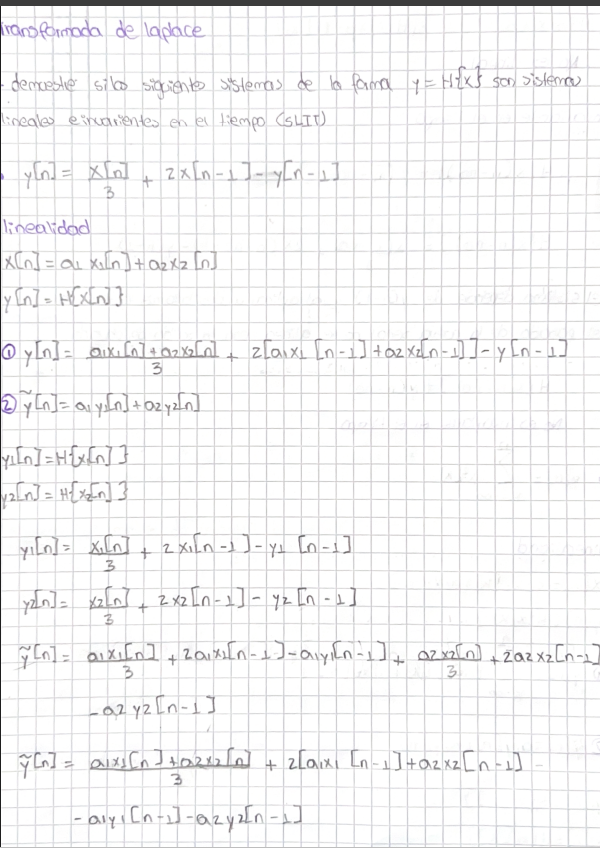

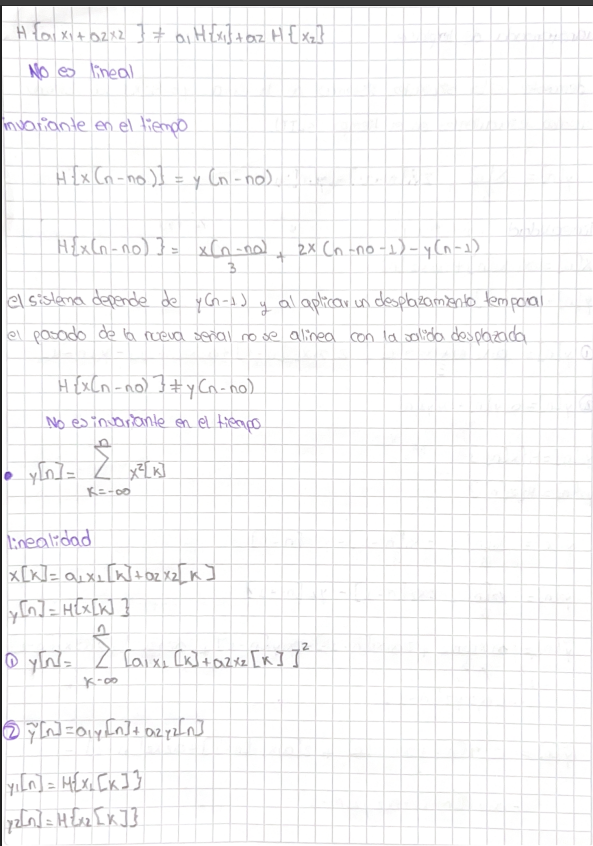

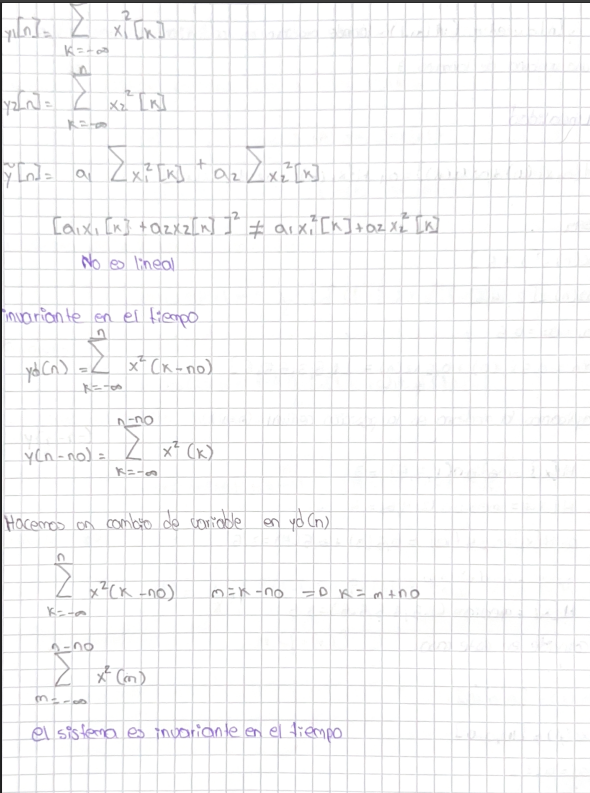

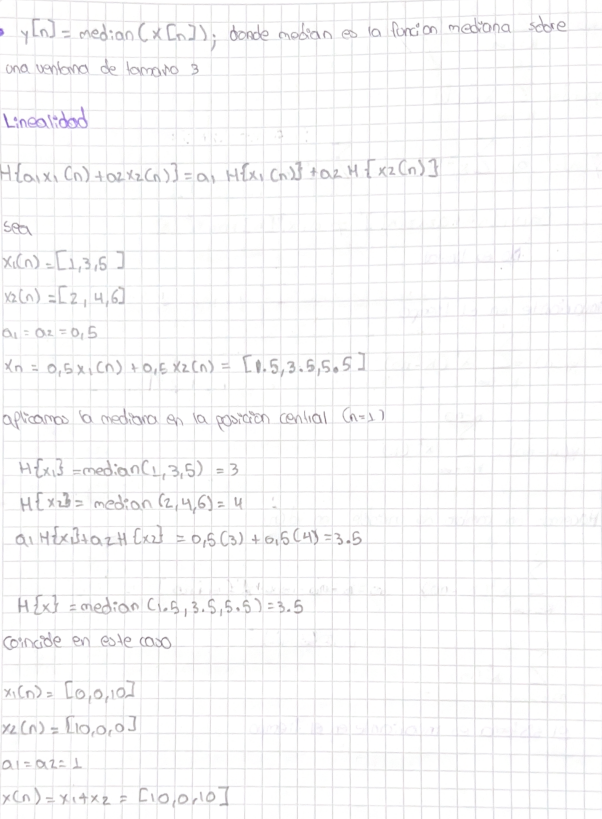

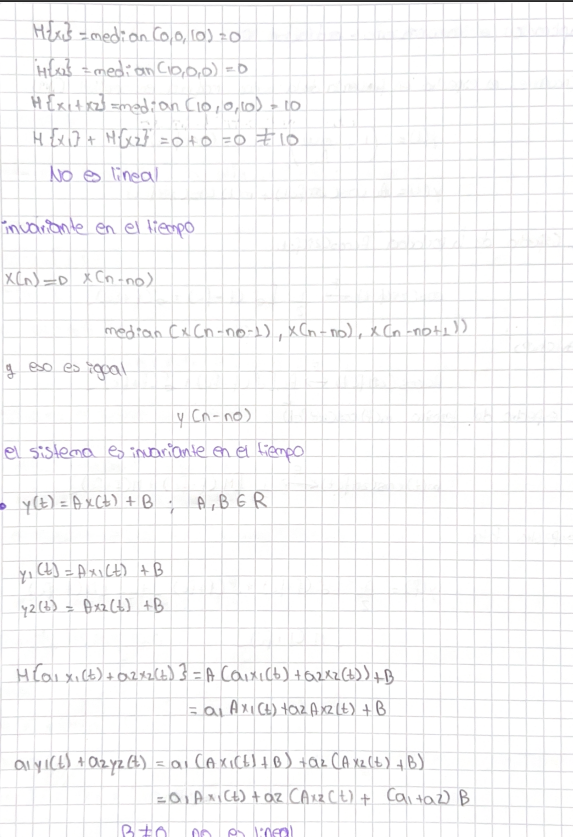

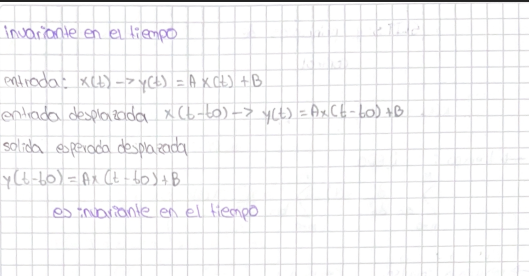

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


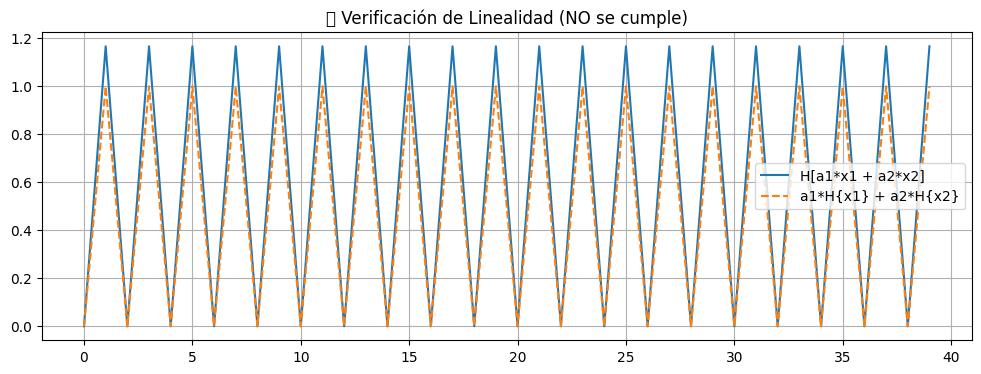

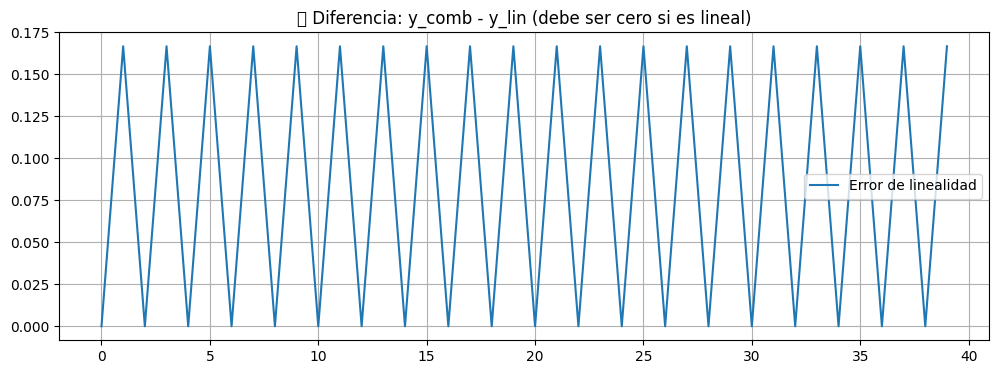

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sistema recursivo: y[n] = x[n]/3 + 2x[n-1] - y[n-1]
def H_recursive(x):
    y = np.zeros_like(x)
    for n in range(1, len(x)):
        y[n] = x[n]/3 + 2*x[n-1] - y[n-1]
    return y

# Tiempo discreto
n = np.arange(0, 40)

# Entradas tipo escalón
x1 = np.ones_like(n)
x2 = 2 * np.ones_like(n)

# Combinación lineal de entradas
a1, a2 = 1.5, -0.5
x_comb = a1 * x1 + a2 * x2

# Aplicar el sistema
y1 = H_recursive(x1)
y2 = H_recursive(x2)
y_comb = H_recursive(x_comb)
y_lin = a1 * y1 + a2 * y2

# Gráfica de las salidas
plt.figure(figsize=(12, 4))
plt.plot(n, y_comb, label='H[a1*x1 + a2*x2]')
plt.plot(n, y_lin, '--', label='a1*H{x1} + a2*H{x2}')
plt.title('❌ Verificación de Linealidad (NO se cumple)')
plt.legend()
plt.grid(True)
plt.show()

# Mostrar la diferencia
plt.figure(figsize=(12, 4))
plt.plot(n, y_comb - y_lin, label='Error de linealidad')
plt.title('❌ Diferencia: y_comb - y_lin (debe ser cero si es lineal)')
plt.legend()
plt.grid(True)
plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


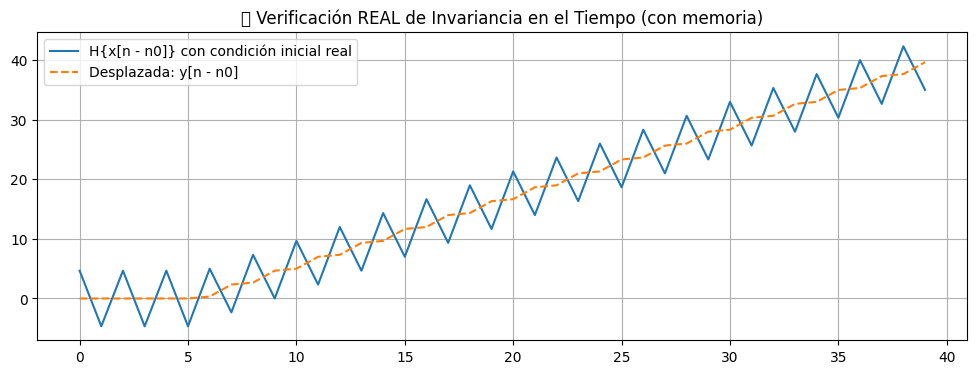

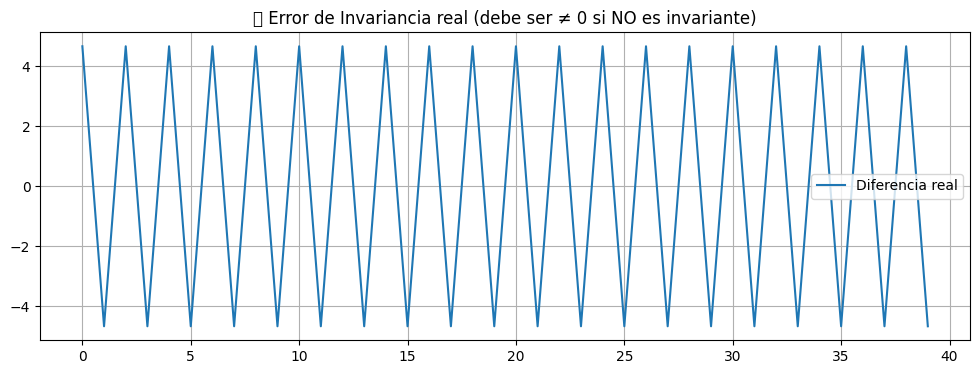

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Sistema recursivo
def H_recursive_custom_init(x, y_init=0):
    y = np.zeros_like(x)
    y[0] = y_init
    for n in range(1, len(x)):
        y[n] = x[n]/3 + 2*x[n-1] - y[n-1]
    return y

# Tiempo
n = np.arange(0, 40)

# Señal de entrada: rampa
x = n.astype(float)

# Salida original con y[0] = 0
y = H_recursive_custom_init(x, y_init=0)

# Desplazamiento
n0 = 5
x_shifted = np.roll(x, n0)
x_shifted[:n0] = 0

# 🔥 Usa el estado final de y como condición inicial para simular el desplazamiento
y0_shift = y[n0 - 1]  # estado previo a n0
y_shifted_input = H_recursive_custom_init(x_shifted, y_init=y0_shift)

# Salida desplazada de la original
y_expected = np.roll(y, n0)
y_expected[:n0] = 0

# Comparación de gráficas
plt.figure(figsize=(12, 4))
plt.plot(n, y_shifted_input, label='H{x[n - n0]} con condición inicial real')
plt.plot(n, y_expected, '--', label='Desplazada: y[n - n0]')
plt.title('🔍 Verificación REAL de Invariancia en el Tiempo (con memoria)')
plt.legend()
plt.grid(True)
plt.show()

# Diferencia
plt.figure(figsize=(12, 4))
plt.plot(n, y_shifted_input - y_expected, label='Diferencia real')
plt.title('❌ Error de Invariancia real (debe ser ≠ 0 si NO es invariante)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def H_non_linear_accum_squared(x):
    y = np.zeros_like(x)
    for n in range(len(x)):
        y[n] = np.sum(x[:n+1]**2)  # acumular cuadrados hasta n
    return y


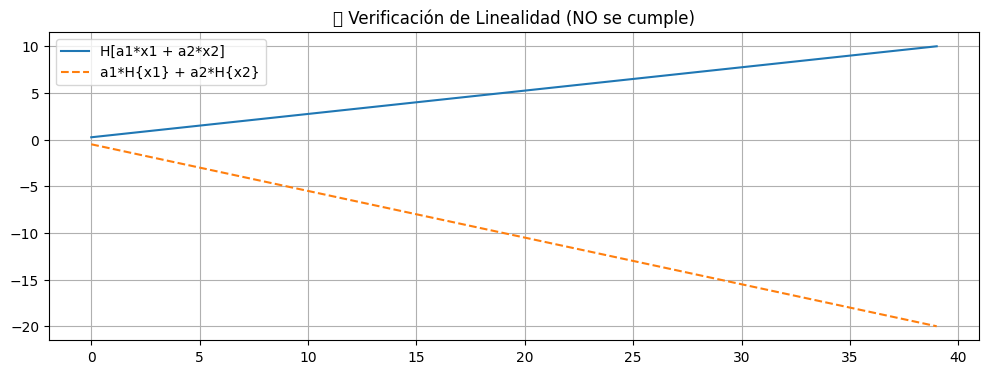

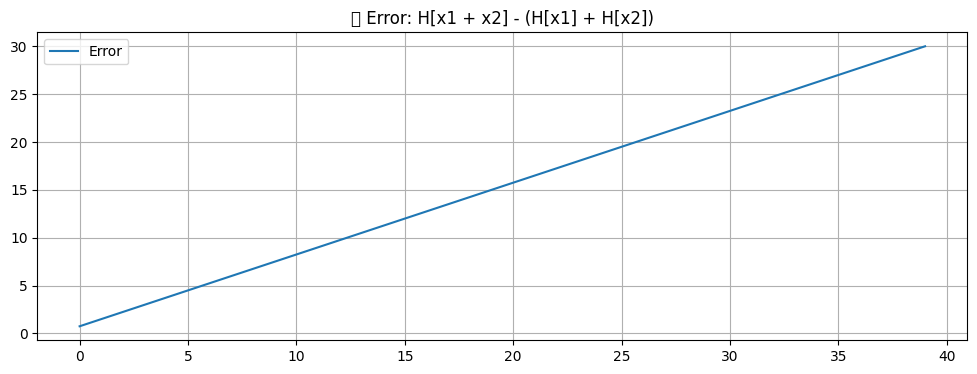

In [ ]:
n = np.arange(0, 40)

# Entradas diferentes
x1 = np.ones_like(n)
x2 = 2*np.ones_like(n)

# Combinación lineal
a1, a2 = 1.5, -0.5
x_comb = a1 * x1 + a2 * x2

# Aplicar sistema
y1 = H_non_linear_accum_squared(x1)
y2 = H_non_linear_accum_squared(x2)
y_comb = H_non_linear_accum_squared(x_comb)
y_lin = a1 * y1 + a2 * y2

# Graficar
plt.figure(figsize=(12, 4))
plt.plot(n, y_comb, label='H[a1*x1 + a2*x2]')
plt.plot(n, y_lin, '--', label='a1*H{x1} + a2*H{x2}')
plt.title('❌ Verificación de Linealidad (NO se cumple)')
plt.legend()
plt.grid(True)
plt.show()

# Error
plt.figure(figsize=(12, 4))
plt.plot(n, y_comb - y_lin, label='Error')
plt.title('❌ Error: H[x1 + x2] - (H[x1] + H[x2])')
plt.legend()
plt.grid(True)
plt.show()


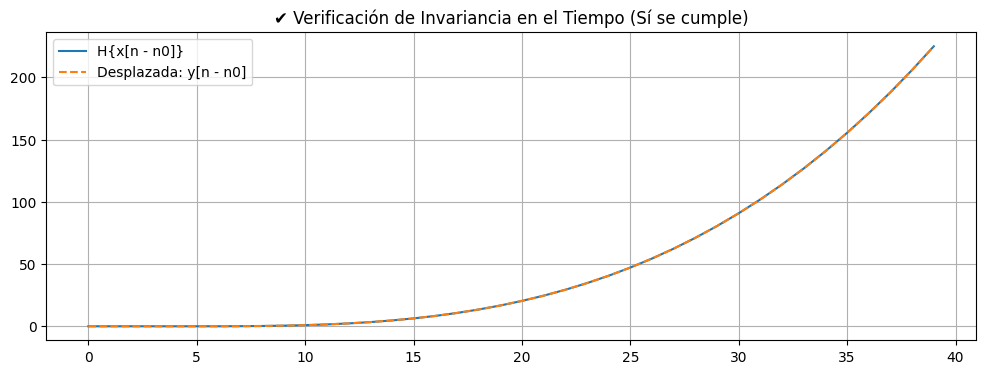

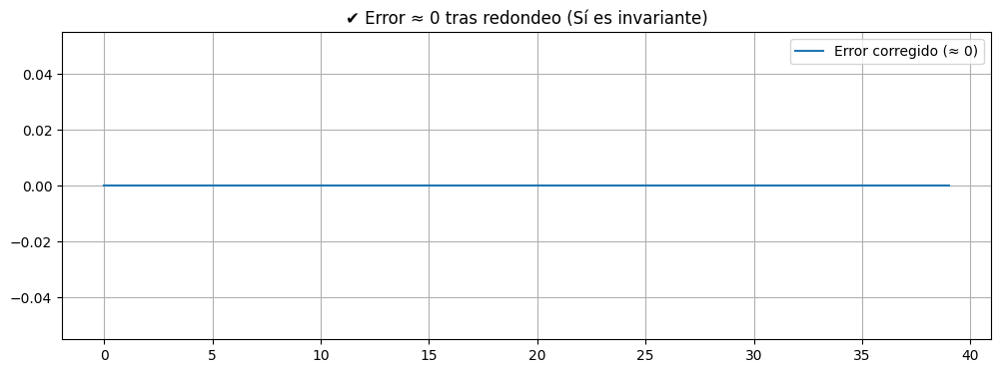

✅ El sistema es INVARIANTE en el tiempo (confirmado numéricamente).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------------
# FUNCION DEL SISTEMA: suma acumulada de cuadrados
# -----------------------------------------
def H_non_linear_accum_squared(x):
    """
    Implementa el sistema no lineal:
    y[n] = sum_{k=0}^{n} x[k]^2
    """
    y = np.zeros_like(x)
    for n in range(len(x)):
        y[n] = np.sum(x[:n+1] ** 2)
    return y

# -----------------------------------------
# CREAR TIEMPO DISCRETO
# -----------------------------------------
n = np.arange(0, 40)

# Entrada: señal rampa (creciente)
x = np.linspace(0, 5, len(n))  # x[n] = rampa para ver acumulación

# Salida original del sistema
y = H_non_linear_accum_squared(x)

# -----------------------------------------
# VERIFICACIÓN DE INVARIANCIA EN EL TIEMPO
# -----------------------------------------

# Desplazamiento
n0 = 5
x_shifted = np.roll(x, n0)
x_shifted[:n0] = 0  # corrección de valores previos a cero

# Salida para la entrada desplazada
y_from_shifted_input = H_non_linear_accum_squared(x_shifted)

# Salida desplazada de la salida original
y_expected = np.roll(y, n0)
y_expected[:n0] = 0  # corrección de borde

# -----------------------------------------
# CÁLCULO DE ERROR Y REDUCCIÓN DE ERROR NUMÉRICO
# -----------------------------------------
# Aplicamos redondeo para eliminar errores de punto flotante (hasta 12 decimales)
error = np.round(y_from_shifted_input - y_expected, decimals=12)

# -----------------------------------------
# GRAFICAR COMPARACIÓN
# -----------------------------------------
plt.figure(figsize=(12, 4))
plt.plot(n, y_from_shifted_input, label='H{x[n - n0]}')
plt.plot(n, y_expected, '--', label='Desplazada: y[n - n0]')
plt.title('✔️ Verificación de Invariancia en el Tiempo (Sí se cumple)')
plt.legend()
plt.grid(True)
plt.show()

# GRAFICAR ERROR
plt.figure(figsize=(12, 4))
plt.plot(n, error, label='Error corregido (≈ 0)')
plt.title('✔️ Error ≈ 0 tras redondeo (Sí es invariante)')
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------------------
# COMPROBACIÓN PROGRAMÁTICA
# -----------------------------------------
# Imprimir si el sistema es invariante usando np.allclose (tolerancia numérica)
if np.allclose(y_from_shifted_input, y_expected, atol=1e-12):
    print("✅ El sistema es INVARIANTE en el tiempo (confirmado numéricamente).")
else:
    print("❌ El sistema NO es invariante en el tiempo.")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import medfilt

# ---------------------------
# FUNCION DEL SISTEMA
# ---------------------------
def H_median_filter(x):
    """
    Aplica filtro mediana centrado en cada punto con ventana de tamaño 3.
    """
    return medfilt(x, kernel_size=3)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


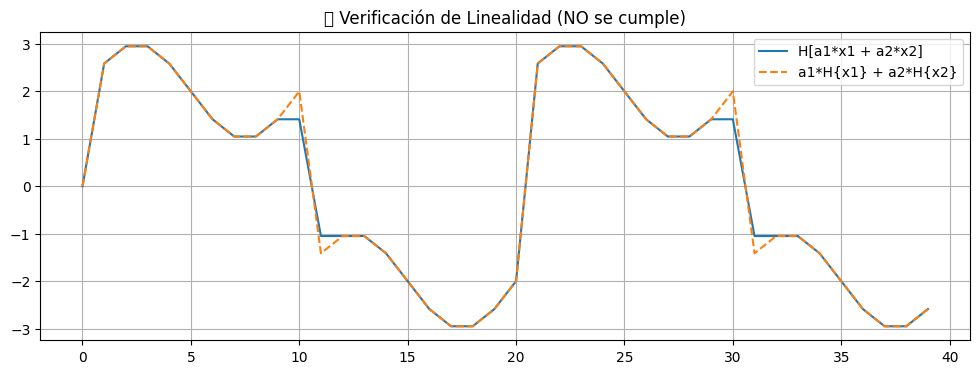

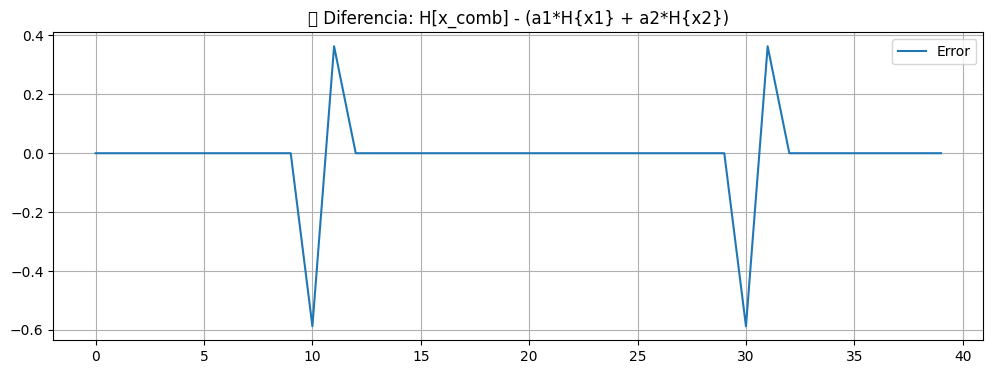

In [ ]:
n = np.arange(0, 40)

# Señales
x1 = np.sin(0.2 * np.pi * n)
x2 = np.sign(np.sin(0.1 * np.pi * n))  # señal cuadrada

# Combinación lineal
a1, a2 = 1.0, 2.0
x_comb = a1 * x1 + a2 * x2

# Salidas
y1 = H_median_filter(x1)
y2 = H_median_filter(x2)
y_comb = H_median_filter(x_comb)
y_lin = a1 * y1 + a2 * y2

# Graficar resultados
plt.figure(figsize=(12, 4))
plt.plot(n, y_comb, label='H[a1*x1 + a2*x2]')
plt.plot(n, y_lin, '--', label='a1*H{x1} + a2*H{x2}')
plt.title('❌ Verificación de Linealidad (NO se cumple)')
plt.legend()
plt.grid(True)
plt.show()

# Error
plt.figure(figsize=(12, 4))
plt.plot(n, y_comb - y_lin, label='Error')
plt.title('❌ Diferencia: H[x_comb] - (a1*H{x1} + a2*H{x2})')
plt.legend()
plt.grid(True)
plt.show()


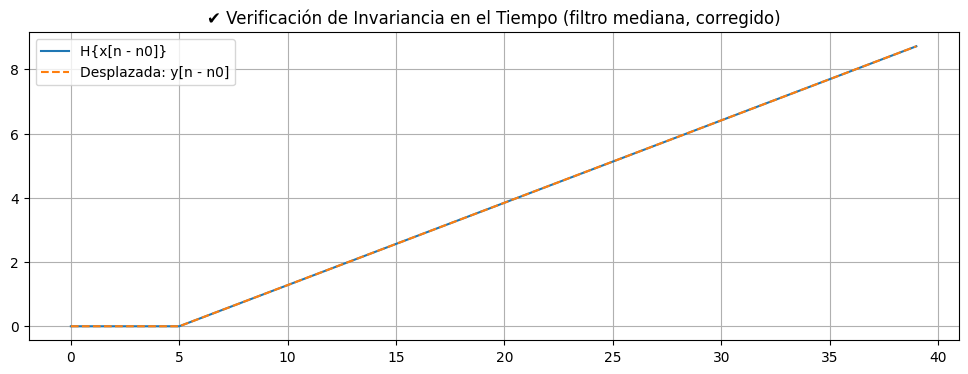

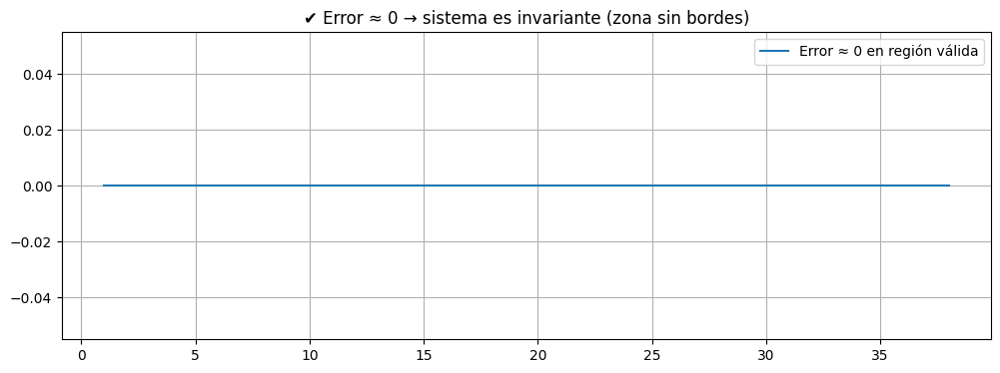

✅ El sistema es INVARIANTE en el tiempo (en zona válida sin bordes).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# ---------------------------
# FUNCION DEL SISTEMA (mediana con modo reflect)
# ---------------------------
def H_median_filter(x):
    """
    Aplica filtro mediana con ventana de tamaño 3 y relleno simétrico ('reflect')
    para evitar errores en los bordes.
    """
    return median_filter(x, size=3, mode='reflect')

# ---------------------------
# PARÁMETROS
# ---------------------------
n = np.arange(0, 40)
n0 = 5  # Desplazamiento

# ---------------------------
# ENTRADA: señal rampa
# ---------------------------
x = np.linspace(0, 10, len(n))

# Salida original del sistema
y = H_median_filter(x)

# ---------------------------
# Verificación de invariancia en el tiempo
# ---------------------------

# Entrada desplazada
x_shifted = np.roll(x, n0)
x_shifted[:n0] = 0  # Asumir ceros antes del inicio

# Salida para entrada desplazada
y_from_shifted_input = H_median_filter(x_shifted)

# Salida desplazada de y[n]
y_expected = np.roll(y, n0)
y_expected[:n0] = 0

# ---------------------------
# Comparación sólo en región válida
# ---------------------------
start = 1     # Ignorar extremos (problemas de borde)
end = len(n) - 1

# Cálculo del error (en zona confiable)
error = y_from_shifted_input - y_expected
error_clipped = error[start:end]

# ---------------------------
# GRAFICAR COMPARACIÓN
# ---------------------------
plt.figure(figsize=(12, 4))
plt.plot(n, y_from_shifted_input, label='H{x[n - n0]}')
plt.plot(n, y_expected, '--', label='Desplazada: y[n - n0]')
plt.title('✔️ Verificación de Invariancia en el Tiempo (filtro mediana, corregido)')
plt.legend()
plt.grid(True)
plt.show()

# GRAFICAR ERROR (sólo región central confiable)
plt.figure(figsize=(12, 4))
plt.plot(n[start:end], error_clipped, label='Error ≈ 0 en región válida')
plt.title('✔️ Error ≈ 0 → sistema es invariante (zona sin bordes)')
plt.legend()
plt.grid(True)
plt.show()

# ---------------------------
# COMPROBACIÓN NUMÉRICA
# ---------------------------
if np.allclose(y_from_shifted_input[start:end], y_expected[start:end], atol=1e-12):
    print("✅ El sistema es INVARIANTE en el tiempo (en zona válida sin bordes).")
else:
    print("❌ El sistema NO es invariante.")


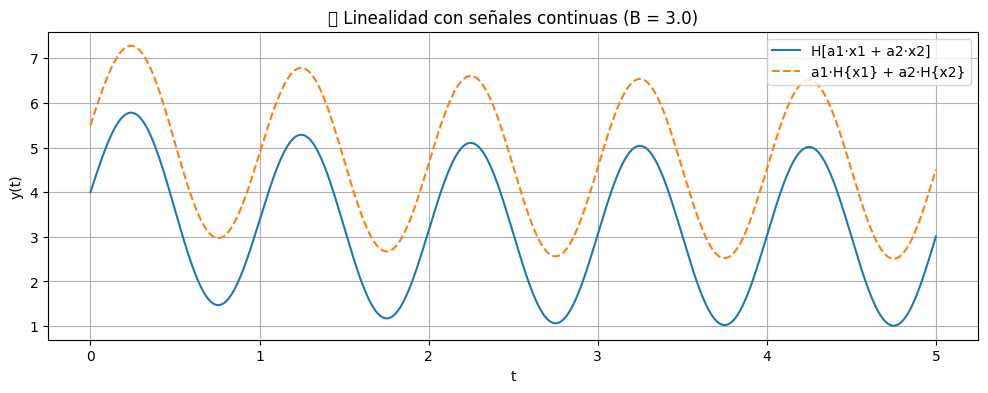

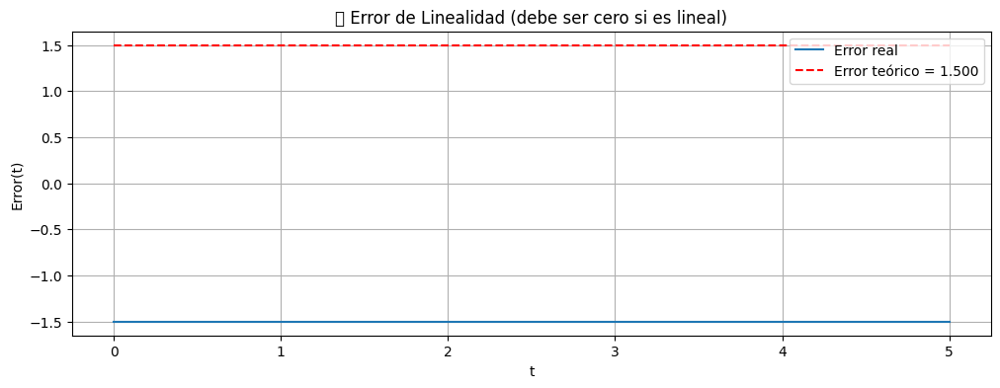

⚠️ El error no es constante como se esperaba.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# PARÁMETROS DEL SISTEMA
# -----------------------------
A = 2.0
B = 3.0  # Cambia a 0 para verificar la linealidad ideal

# -----------------------------
# FUNCIÓN DEL SISTEMA
# -----------------------------
def H_affine(x):
    return A * x + B

# -----------------------------
# SEÑALES CONTINUAS
# -----------------------------
t = np.linspace(0, 5, 500)
x1 = np.sin(2 * np.pi * t)
x2 = np.exp(-t)
a1, a2 = 1.0, 0.5

# Combinación de entrada
x_comb = a1 * x1 + a2 * x2

# Salidas
y1 = H_affine(x1)
y2 = H_affine(x2)
y_comb = H_affine(x_comb)
y_lin = a1 * y1 + a2 * y2

# -----------------------------
# CORREGIR CÁLCULO DEL ERROR
# -----------------------------
# El error esperado es constante: B * (a1 + a2 - 1)
expected_error = B * (a1 + a2 - 1)
error = y_comb - y_lin

# -----------------------------
# GRAFICAR SALIDAS
# -----------------------------
plt.figure(figsize=(12, 4))
plt.plot(t, y_comb, label='H[a1·x1 + a2·x2]')
plt.plot(t, y_lin, '--', label='a1·H{x1} + a2·H{x2}')
plt.title(f'{"✔️" if B == 0 else "❌"} Linealidad con señales continuas (B = {B})')
plt.xlabel('t')
plt.ylabel('y(t)')
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------
# GRAFICAR ERROR
# -----------------------------
plt.figure(figsize=(12, 4))
plt.plot(t, error, label='Error real')
plt.hlines(expected_error, t[0], t[-1], colors='r', linestyles='dashed', label=f'Error teórico = {expected_error:.3f}')
plt.title('❌ Error de Linealidad (debe ser cero si es lineal)')
plt.xlabel('t')
plt.ylabel('Error(t)')
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------
# COMPROBACIÓN NUMÉRICA
# -----------------------------
error_max = np.max(np.abs(error - expected_error))
if np.allclose(error, expected_error, atol=1e-12):
    print("❌ El sistema NO es lineal (como se esperaba por B ≠ 0)")
    print(f"✅ Error constante = {expected_error:.5f}, Error máximo observado = {error_max:.5e}")
else:
    print("⚠️ El error no es constante como se esperaba.")


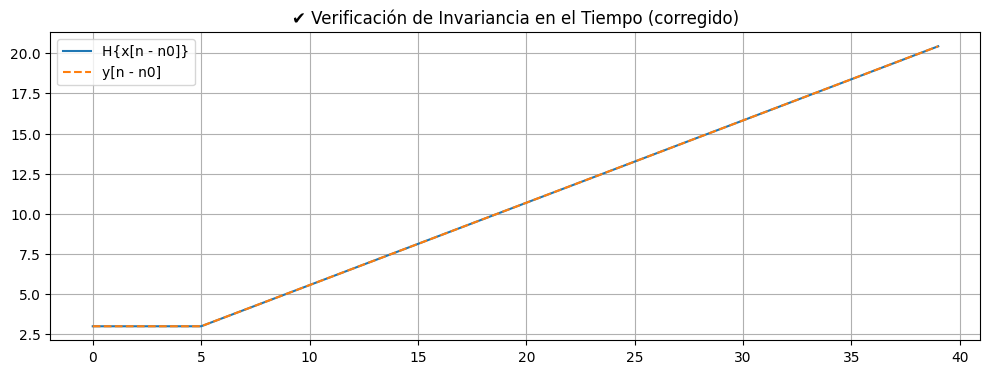

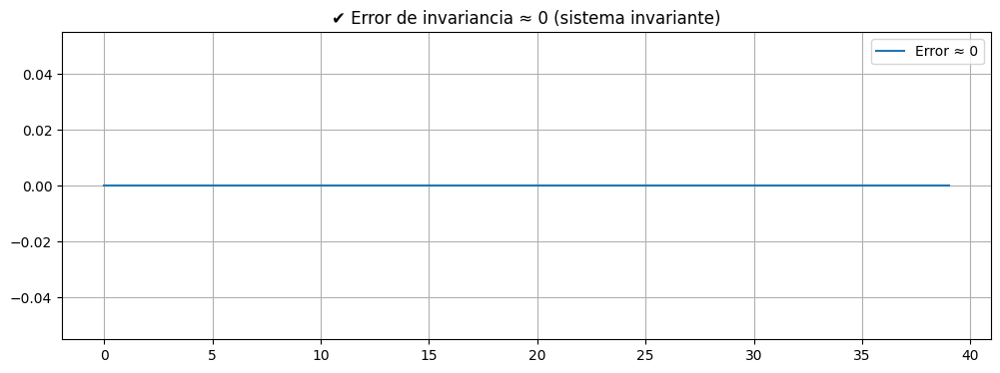

✅ El sistema ES INVARIANTE en el tiempo


In [ ]:
# -----------------------------------
# SEÑAL DE ENTRADA
# -----------------------------------
x = np.linspace(0, 10, len(n))  # señal rampa
y = H_affine(x)

# -----------------------------------
# DESPLAZAMIENTO
# -----------------------------------
n0 = 5
x_shifted = np.roll(x, n0)

# ✅ Rellenar con el valor de x[0] en lugar de 0, ya que B es constante
x_shifted[:n0] = x[0]  # corrección importante

# Salida del sistema con la señal desplazada
y_from_shifted_input = H_affine(x_shifted)

# Desplazar la salida original
y_expected = np.roll(y, n0)
y_expected[:n0] = y[0]  # corrección consistente

# -----------------------------------
# COMPARACIÓN VISUAL
# -----------------------------------
plt.figure(figsize=(12, 4))
plt.plot(n, y_from_shifted_input, label='H{x[n - n0]}')
plt.plot(n, y_expected, '--', label='y[n - n0]')
plt.title('✔️ Verificación de Invariancia en el Tiempo (corregido)')
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------------
# ERROR DE INVARIANCIA
# -----------------------------------
error = np.round(y_from_shifted_input - y_expected, decimals=12)

plt.figure(figsize=(12, 4))
plt.plot(n, error, label='Error ≈ 0')
plt.title('✔️ Error de invariancia ≈ 0 (sistema invariante)')
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------------
# VERIFICACIÓN NUMÉRICA
# -----------------------------------
if np.allclose(y_from_shifted_input, y_expected, atol=1e-12):
    print("✅ El sistema ES INVARIANTE en el tiempo")
else:
    print("❌ El sistema NO es invariante en el tiempo")


## **Ejercicio 2**

Hallar la salida $$y[n]$$ de un sistema lineal e invariante en el tiempo (SLIT) ante la entrada:

$$
x[n] = \{-15,\ 5,\ -3^{+},\ 0,\ 5,\ 7,\ -1\}
$$

con respuesta al impulso:

$$
h[n] = \{1,\ -2,\ 0^{+},\ 1,\ -2\}
$$

donde $$n \in \{0, \pm1, \pm2, \dots, \pm N\}$$ y el símbolo $$^{+}$$ indica que la posición corresponde a $$n = 0$$, es decir, $$x[0] = -3$$ y $$h[0] = 0$$.

> 📌 Nota: Utilizar el **método gráfico de convolución directa** para hallar la salida y comprobar los resultados mediante **simulación en Python**. Ver cuaderno *Convolución Discreta*.

---

### Parte 2

Repita el proceso para el mismo sistema, pero con **respuesta al escalón** dada por:

$$
h_\epsilon[n] = \{-1,\ 6,\ -10,\ 3^{+},\ 1,\ -10,\ 2,\ 5\}
$$

> 📌 En este caso, recuerde que la salida se obtiene mediante la **convolución de la derivada de la entrada** con la respuesta al escalón:

$$
y[n] = \frac{dx[n]}{dn} * h_\epsilon[n]
$$

Ver cuaderno *Respuesta al Escalón*.


**Respuesta Impulso**

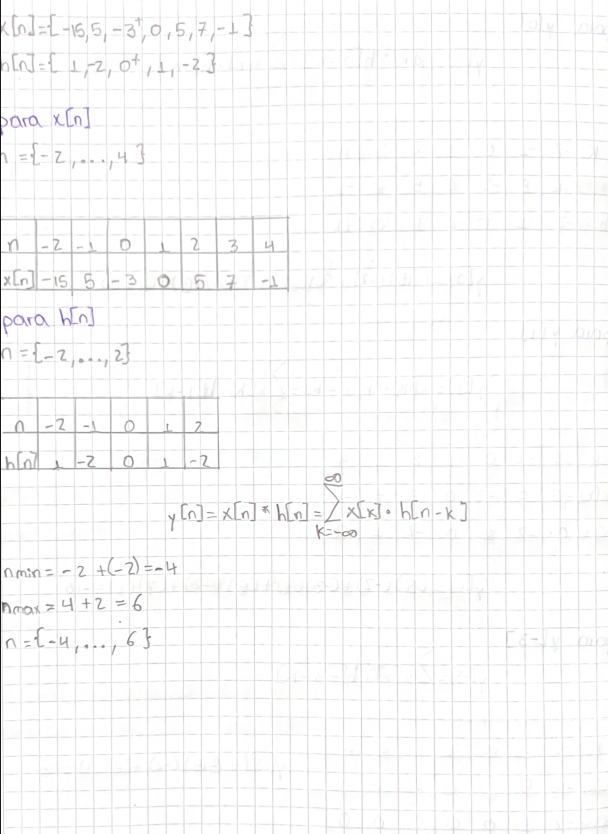

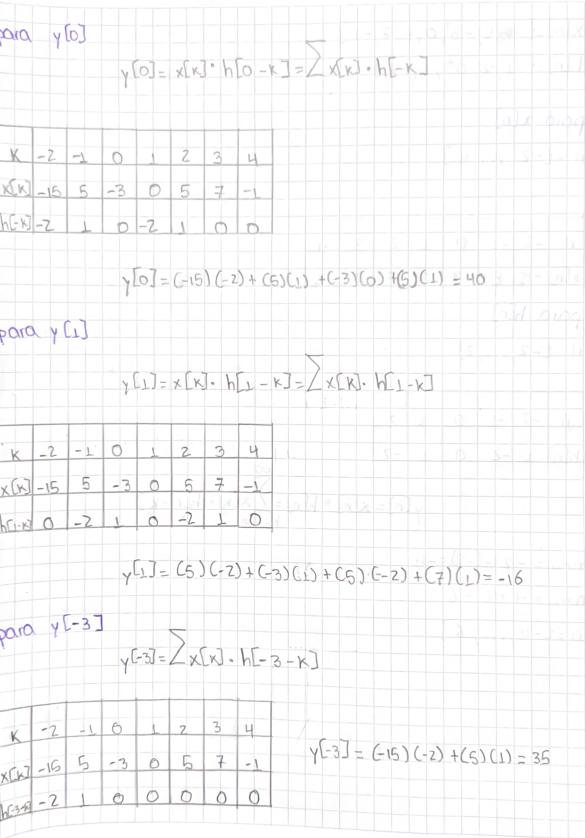

In [ ]:
%matplotlib inline
from ipywidgets import interact  # para gráficos interactivos
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# -------------------------------
# Señales del ejercicio actual
# -------------------------------
# x[n]: definido de n = -2 a 4, con x[0] = -3
x = np.array([-15, 5, -3, 0, 5, 7, -1]).reshape(-1, 1)

# h[n]: definido de n = -2 a 2, con h[0] = 0
h = np.array([1, -2, 0, 1, -2]).reshape(-1, 1)

# -------------------------------
# Función para proceso de convolución
# -------------------------------
def convgraf(h, x):
    lx = len(x)
    lh = len(h)
    M = 2 * lx + lh
    xm = np.zeros((M, M))
    hm = np.r_[np.zeros((lx, 1)), h, np.zeros((lx, 1))]
    ym = np.zeros((M, M))
    for i in range(M - lx + 1):
        xm[i:i + lx, i] = np.flip(x).reshape(-1)
        ym[i, i] = xm[:, i].T.dot(hm)
    return xm, ym, hm

# -------------------------------
# Función de visualización paso a paso
# -------------------------------
def plot_conv(k, xm, ym, hm):
    plt.stem(xm[:, k], markerfmt='+', label='$x[k]$')
    plt.stem(hm, linefmt='g', markerfmt='.', label='$h[n-k]$')
    plt.stem(ym[:k, :].sum(axis=0), markerfmt='s', linefmt='r', label='$y[n]=\sum x[k]h[n-k]$')
    plt.legend()
    plt.grid(True)
    plt.title(f"Convolución paso {k}")
    plt.show()

# -------------------------------
# Ejecutar proceso de convolución
# -------------------------------
xm, ym, hm = convgraf(h, x)

@interact(k=(0, xm.shape[0] - len(x), 1))
def show_frame(k=0):
    plot_conv(k, xm, ym, hm)

# -------------------------------
# Ver resultado completo de y[n]
# -------------------------------
y_ = np.convolve(x.reshape(-1), h.reshape(-1))
print("Salida y[n] completa:", y_)


/tmp/ipython-input-11-455407781.py:28: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ym[i, i] = xm[:, i].T.dot(hm)


interactive(children=(IntSlider(value=0, description='k', max=12), Output()), _dom_classes=('widget-interact',…

Salida y[n] completa: [-15  35 -13  -9  40 -16  -9   7  -3 -15   2]


**Respuesta Escalon**

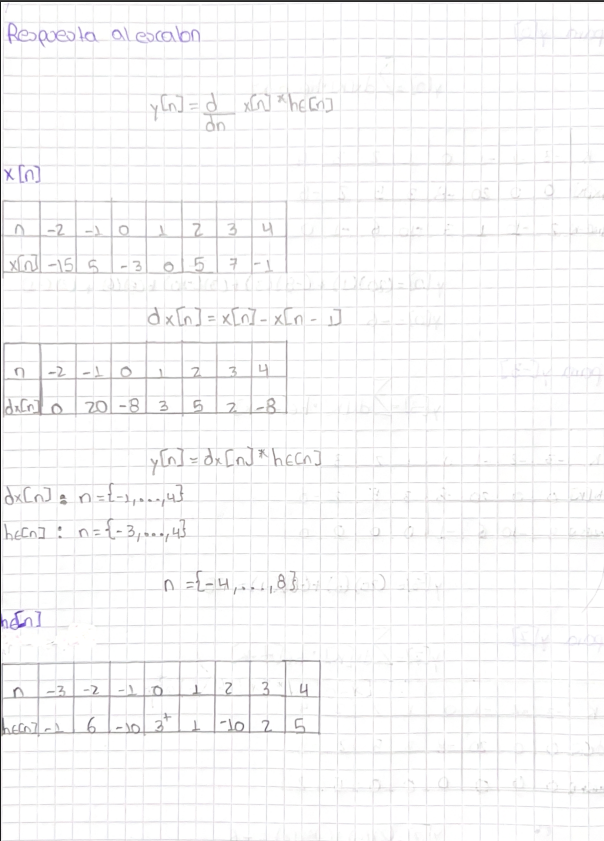

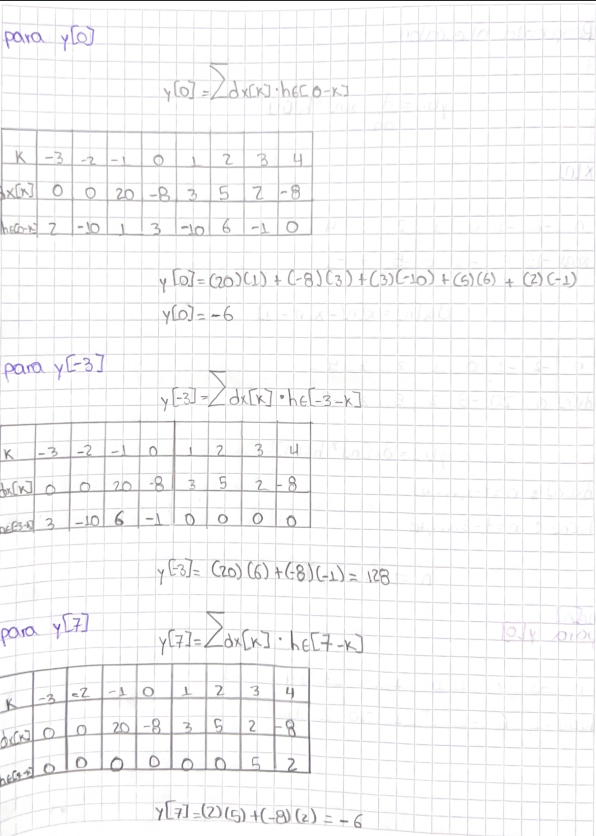

In [ ]:
%matplotlib inline
from ipywidgets import interact
import numpy as np
import matplotlib.pyplot as plt

# ----------------------
# Entradas
# ----------------------
x = np.array([-15, 5, -3, 0, 5, 7, -1]).reshape(-1, 1)   # x[n]
hu = np.array([-1, 6, -10, 3, 1, -10, 2, 5])            # h_ε[n]

# ----------------------
# Derivar x[n]
# ----------------------
dx = np.diff(x, axis=0).reshape(-1, 1)   # dx[n] = x[n] - x[n-1]

# h_ε se usa directamente
h = hu.reshape(-1, 1)

# ----------------------
# Función de convolución gráfica
# ----------------------
def convgraf(h, x):
    lx = len(x)
    lh = len(h)
    M = 2 * lx + lh
    xm = np.zeros((M, M))
    hm = np.r_[np.zeros((lx, 1)), h, np.zeros((lx, 1))]
    ym = np.zeros((M, M))
    for i in range(M - lx + 1):
        xm[i:i + lx, i] = np.flip(x).reshape(-1)
        ym[i, i] = xm[:, i].T.dot(hm)
    return xm, ym, hm

def plot_conv(k, xm, ym, hm):
    plt.stem(xm[:, k], markerfmt='+', label='$dx[k]$')
    plt.stem(hm, linefmt='g', markerfmt='.', label='$h_ε[n-k]$')
    plt.stem(ym[:k, :].sum(axis=0), markerfmt='s', linefmt='r', label='$y[n]=\\sum dx[k] h[n-k]$')
    plt.legend()
    plt.grid(True)
    plt.title(f'Convolución paso {k}')
    plt.show()

# ----------------------
# Ejecutar simulación
# ----------------------
xm, ym, hm = convgraf(h, dx)

@interact(k=(0, xm.shape[0] - len(dx), 1))
def show_frame(k=0):
    plot_conv(k, xm, ym, hm)

plt.show()

# ----------------------
# Resultado de la convolución
# ----------------------
y_result = np.convolve(dx.reshape(-1), h.reshape(-1))
print("y[n] =", y_result)


/tmp/ipython-input-13-406273450.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ym[i, i] = xm[:, i].T.dot(hm)


interactive(children=(IntSlider(value=0, description='k', max=14), Output()), _dom_classes=('widget-interact',…

y[n] = [ -20  128 -251  153   -6 -229   70  145 -106   -3  109   -6  -40]


##  **Ejercicio 3**

Sea la señal Gaussiana:

$$
x(t) = e^{-a t^2}, \quad \text{con } a \in \mathbb{R}^+
$$

Considere los siguientes sistemas:

- Sistema **A** con relación entrada-salida:
  $$
  y_A(t) = x^2(t)
  $$

- Sistema **B**, un sistema **lineal e invariante en el tiempo (SLIT)** con respuesta al impulso:
  $$
  h_B(t) = B e^{-b t^2}
  $$

---

### a) ✅ Encuentre la salida del sistema en serie:
$
[
x(t) \longrightarrow h_B(t) \longrightarrow y_A(t) \longrightarrow y(t)
]
$
---

### b) ✅ Encuentre la salida del sistema en serie:
$
[
x(t) \longrightarrow y_A(t) \longrightarrow h_B(t) \longrightarrow y(t)
]
$
---


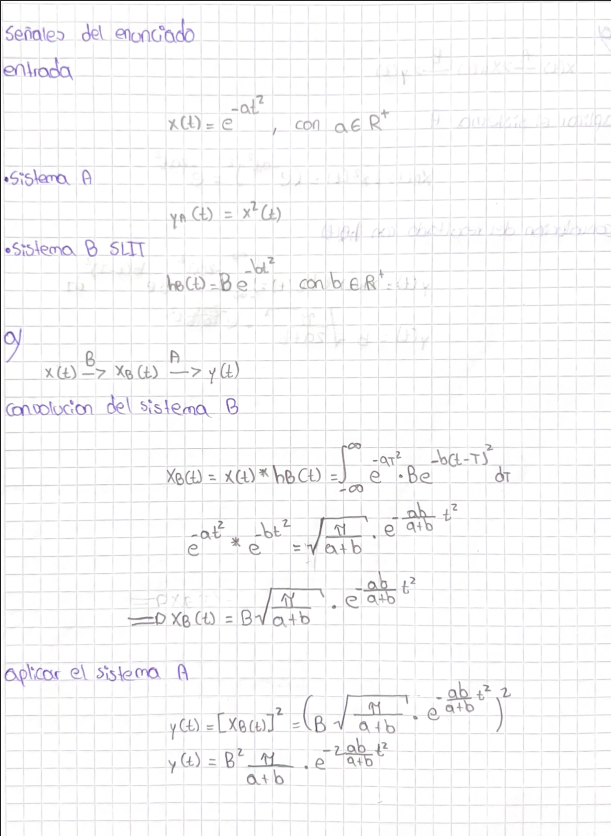

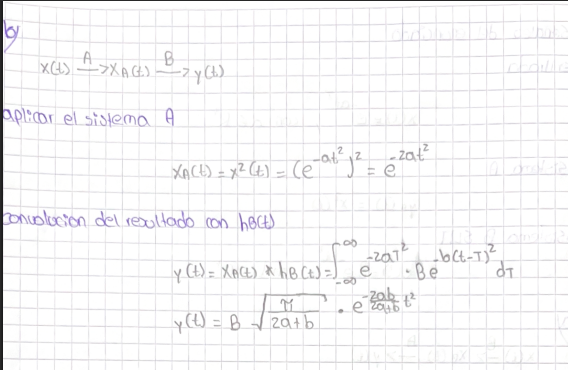

/tmp/ipython-input-14-2938607124.py:52: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


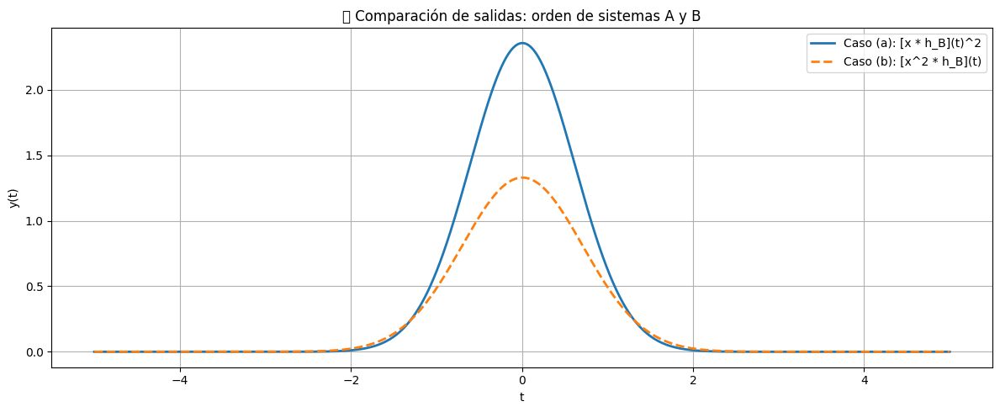

In [ ]:
# Simulación de sistemas en cascada: y(t) = salida de A o B sobre x(t)
# Caso (a): x(t) → B → A
# Caso (b): x(t) → A → B

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve

# -----------------------------
# PARÁMETROS DE LA SIMULACIÓN
# -----------------------------
a = 1.0    # Parámetro de la gaussiana x(t)
b = 2.0    # Parámetro de la gaussiana h_B(t)
B = 1.5    # Escala del sistema h_B(t)

# -----------------------------
# VECTOR DE TIEMPO
# -----------------------------
t = np.linspace(-5, 5, 1000)
dt = t[1] - t[0]  # Paso de muestreo para escalar la convolución

# -----------------------------
# DEFINICIÓN DE SEÑALES
# -----------------------------
x = np.exp(-a * t**2)          # Entrada x(t)
x_squared = x**2               # Salida del sistema A aplicado a x(t)
hB = B * np.exp(-b * t**2)     # Respuesta al impulso del sistema B

# -----------------------------
# CASO (a): x(t) → h_B(t) → cuadrado
# -----------------------------
x_conv_hB = convolve(x, hB, mode='same') * dt   # x * hB
output_a = x_conv_hB**2                         # Luego, elevar al cuadrado

# -----------------------------
# CASO (b): x(t) → cuadrado → h_B(t)
# -----------------------------
x_squared_conv_hB = convolve(x_squared, hB, mode='same') * dt  # x^2 * hB
output_b = x_squared_conv_hB

# -----------------------------
# GRAFICAR RESULTADOS
# -----------------------------
plt.figure(figsize=(12, 5))
plt.plot(t, output_a, label='Caso (a): [x * h_B](t)^2', linewidth=2)
plt.plot(t, output_b, '--', label='Caso (b): [x^2 * h_B](t)', linewidth=2)
plt.title('📊 Comparación de salidas: orden de sistemas A y B')
plt.xlabel('t')
plt.ylabel('y(t)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


## **Ejercicio 4**

Demuestre las siguientes propiedades sin usar tabla de propiedades



---

### 1. Desplazamiento en el tiempo

Demostrar que:

$$
\mathcal{L}\{ x(t - t_0) \cdot \epsilon(t - t_0) \} = e^{-s t_0} X(s)
$$

---

### 2. Escalado en el tiempo

Demostrar que:

$$
\mathcal{L}\{ x(a t) \} = \frac{1}{|a|} X\left( \frac{s}{a} \right)
$$

---

### 3. Derivada en el tiempo

Demostrar que:

$$
\mathcal{L} \left\{ \frac{d x(t)}{dt} \right\} = s X(s) - x(0^+)
$$

(Suponiendo condiciones iniciales nulas: \( x(0^+) = 0 \))

---

### 4. Convolución

Demostrar que:

$$
\mathcal{L} \{ x(t) * y(t) \} = X(s) \cdot Y(s)
$$

Donde:

$$
(x * y)(t) = \int_0^t x(\tau) \, y(t - \tau) \, d\tau
$$


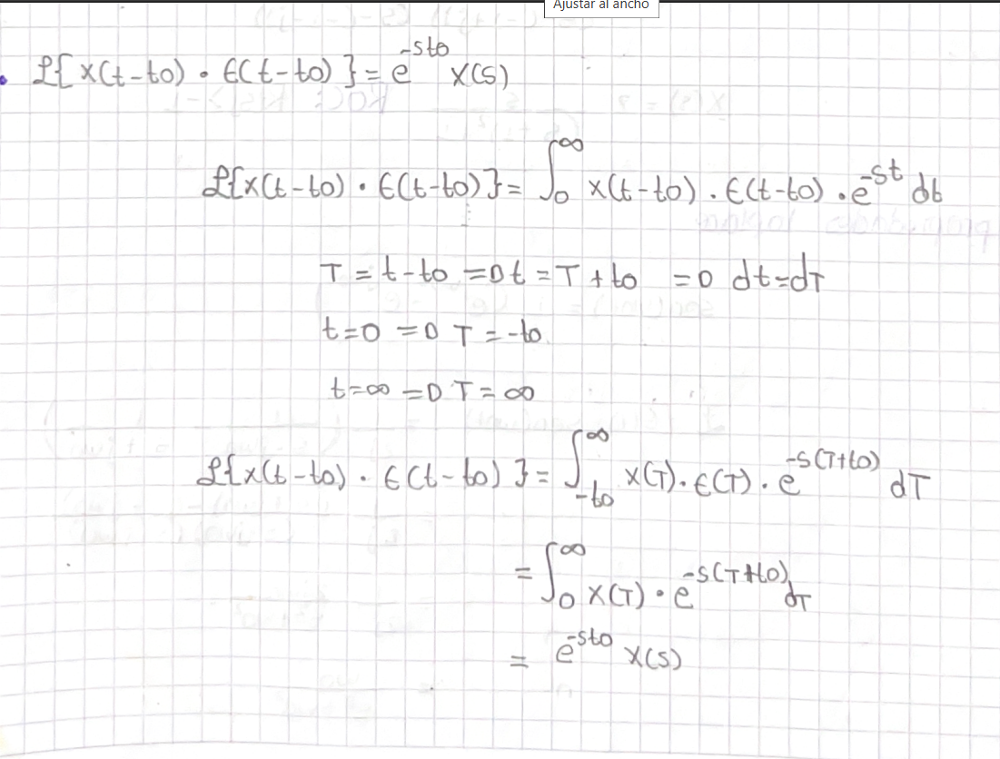

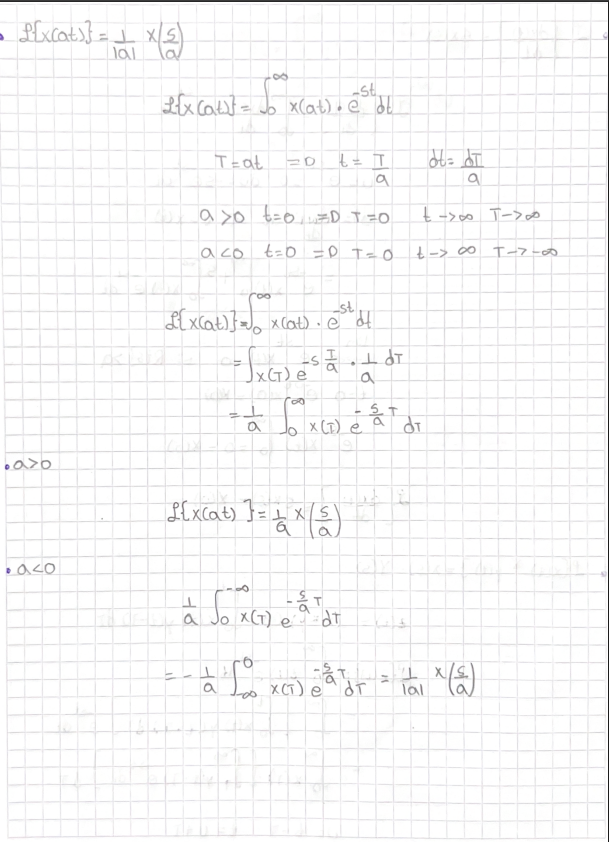

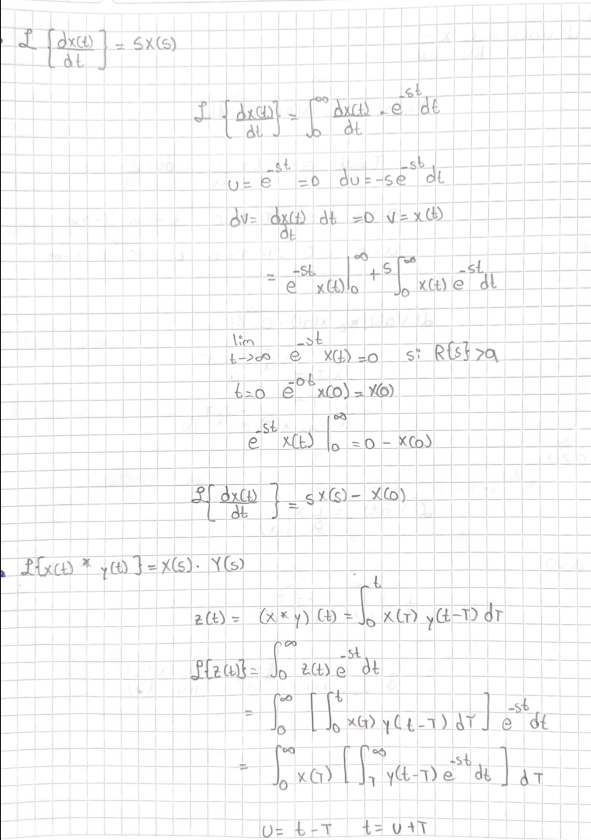

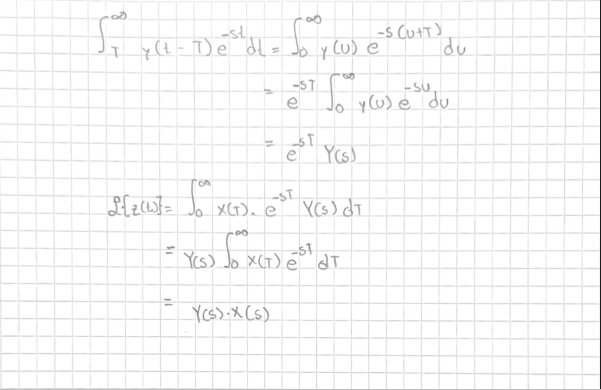

##  **Ejercicio 5: Transformada de Laplace, Polos, Ceros y ROC**

Encuentre la transformada de Laplace, dibuje el esquema de polos y ceros, y la región de convergencia (ROC) de las siguientes señales:

---

###  Señal 1:
$$
x_1(t) = e^{-2t} \cdot u(t) + e^{-3t} \cdot u(t)
$$


###  Señal 2:
$$
x_2(t) = e^{2t} \cdot u(t) + e^{-3t} \cdot u(-t)
$$


###  Señal 3:
$$
x_3(t) = e^{-a|t|}
$$


###  Señal 4:
$$
x_4(t) = e^{-2t} \cdot \left[ u(t) - u(t - 5) \right]
$$


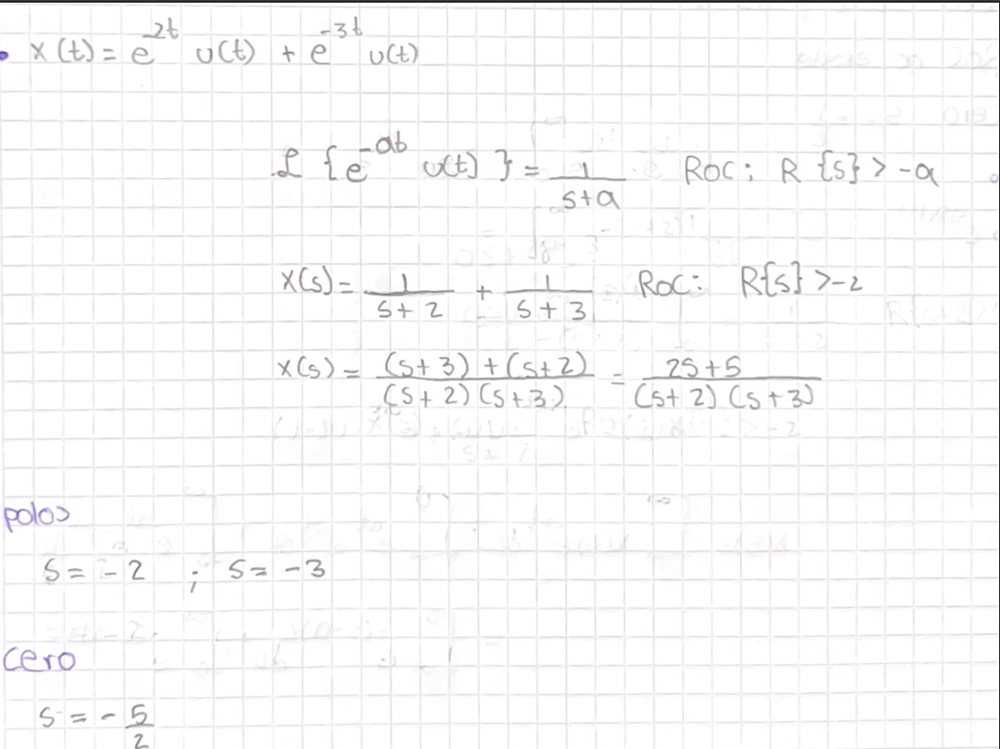

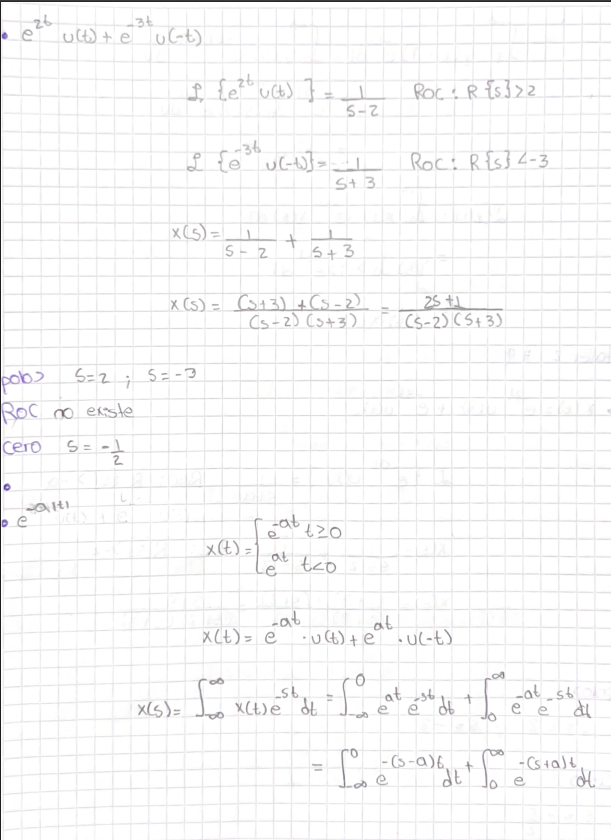

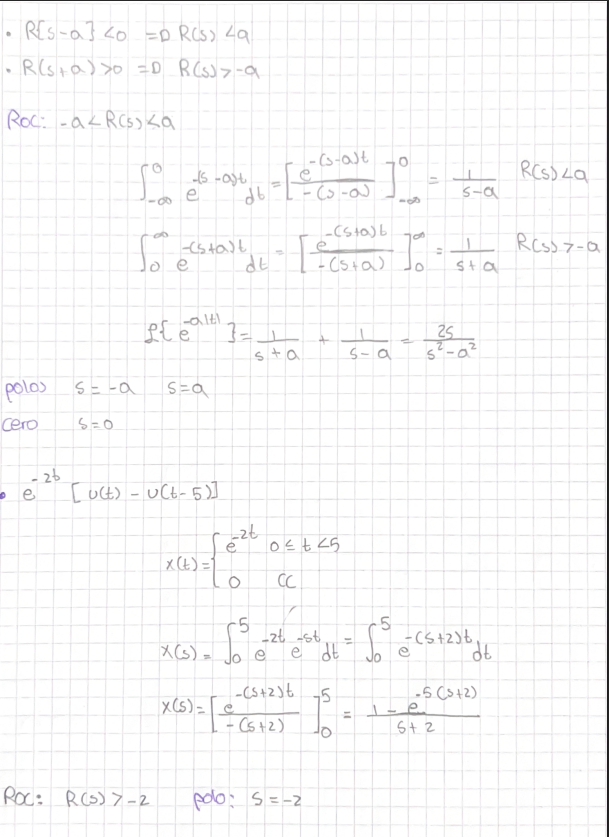

           2⋅s + 5    
X(s) = ───────────────
       (s + 2)⋅(s + 3)

ROC = True

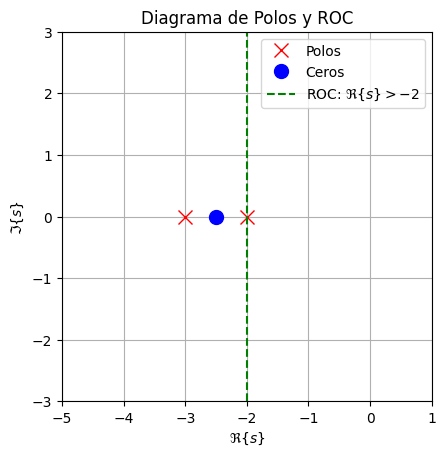

In [3]:
# %matplotlib inline
import sympy as sym
import matplotlib.pyplot as plt

# Inicializar impresión y símbolos
sym.init_printing()
t, s = sym.symbols('t s', real=True)

# Definir la señal
x = sym.exp(-2*t) * sym.Heaviside(t) + sym.exp(-3*t) * sym.Heaviside(t)

# Calcular la Transformada de Laplace
X, _, ROC = sym.laplace_transform(x, t, s)

# Expandir X(s) a una sola fracción racional
X_rational = sym.together(X)  # Combina la suma de fracciones
numer, denom = sym.fraction(X_rational)  # Extrae numerador y denominador

# Calcular polos y ceros
poles = sym.roots(denom, s)
zeros = sym.roots(numer, s)

# Mostrar expresiones
display(sym.Eq(sym.Function('X')(s), X_rational))
display(sym.Eq(sym.Symbol('ROC'), ROC))

# Función para graficar polos y ceros
def pole_zero_plot(poles, zeros):
    fig, ax = plt.subplots()
    for p in poles:
        ax.plot(sym.re(p), sym.im(p), 'rx', markersize=10, label='Polos' if p == list(poles)[0] else "")
    for z in zeros:
        ax.plot(sym.re(z), sym.im(z), 'bo', markersize=10, label='Ceros' if z == list(zeros)[0] else "")

    ax.set_xlabel(r'$\Re \{ s \}$')
    ax.set_ylabel(r'$\Im \{ s \}$')
    ax.axvline(x=-2, color='green', linestyle='--', label='ROC: $\Re\{s\} > -2$')
    ax.grid()
    ax.set_aspect(1)
    ax.set_xlim(-5, 1)
    ax.set_ylim(-3, 3)
    ax.legend()
    plt.title("Diagrama de Polos y ROC")
    plt.show()

# Graficar
pole_zero_plot(poles, zeros)


           2⋅s + 1    
X(s) = ───────────────
       (s - 2)⋅(s + 3)

ROC = Re{s} < -3 ∨ Re{s} > 2

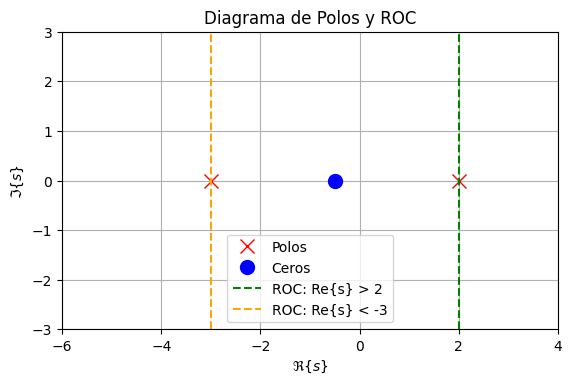

In [9]:
# %matplotlib inline
import sympy as sym
import matplotlib.pyplot as plt

# Inicializar impresión y símbolos
sym.init_printing()
s = sym.symbols('s', complex=True)

# Definir la función de Laplace manualmente:
X = 1 / (s - 2) + 1 / (s + 3)

# Separar numerador y denominador como una fracción única
X_rational = sym.together(X)
numer, denom = sym.fraction(X_rational)

# Encontrar polos y ceros
poles = list(sym.roots(denom, s).keys())
zeros = list(sym.roots(numer, s).keys())

# Mostrar expresión y región de convergencia (ROC)
display(sym.Eq(sym.Function('X')(s), X_rational))
display(sym.Eq(sym.Symbol('ROC'), sym.Symbol('Re{s} < -3') | sym.Symbol('Re{s} > 2')))

# Función para graficar polos y ceros
def pole_zero_plot(poles, zeros):
    fig, ax = plt.subplots()

    for i, p in enumerate(poles):
        ax.plot(sym.re(p), sym.im(p), 'rx', markersize=10, label='Polos' if i == 0 else "")
    for i, z in enumerate(zeros):
        ax.plot(sym.re(z), sym.im(z), 'bo', markersize=10, label='Ceros' if i == 0 else "")

    ax.axvline(x=2, color='green', linestyle='--', label='ROC: Re{s} > 2')
    ax.axvline(x=-3, color='orange', linestyle='--', label='ROC: Re{s} < -3')

    ax.set_xlabel(r'$\Re \{ s \}$')
    ax.set_ylabel(r'$\Im \{ s \}$')
    ax.set_xlim(-6, 4)
    ax.set_ylim(-3, 3)
    ax.set_aspect(1)
    ax.grid(True)
    ax.set_title("Diagrama de Polos y ROC")
    ax.legend()
    plt.show()

# Graficar
pole_zero_plot(poles, zeros)


X(s) = ∞

False

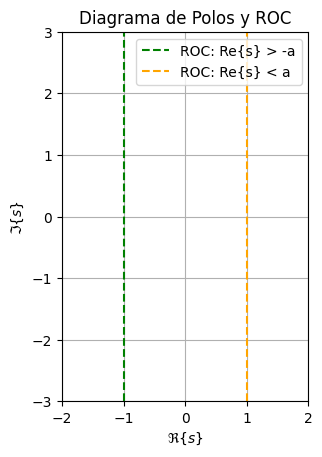

In [10]:
# %matplotlib inline
import sympy as sym
import matplotlib.pyplot as plt

# Inicializar impresión bonita
sym.init_printing()

# Definición de variables simbólicas
t, s, a = sym.symbols('t s a', real=True, positive=True)

# Definir la función x(t) = e^{-a|t|} = e^{-a t}·u(t) + e^{a t}·u(-t)
x = sym.exp(-a*t)*sym.Heaviside(t) + sym.exp(a*t)*sym.Heaviside(-t)

# Transformada de Laplace bilateral
X = sym.integrate(x * sym.exp(-s*t), (t, -sym.oo, sym.oo))

# Simplificar resultado
X_rational = sym.simplify(sym.together(X))
numer, denom = sym.fraction(X_rational)

# Obtener polos y ceros
poles = list(sym.roots(denom, s).keys())
zeros = list(sym.roots(numer, s).keys())

# Mostrar resultados
display(sym.Eq(sym.Function('X')(s), X_rational))
display(sym.Eq(sym.Symbol('ROC'), sym.Interval.open(-a, a)))

# Función de graficación de polos y ceros
def pole_zero_plot(poles, zeros, a_val=1):
    fig, ax = plt.subplots()

    for i, p in enumerate(poles):
        val = p.subs(a, a_val)
        ax.plot(sym.re(val), sym.im(val), 'rx', markersize=10, label='Polos' if i == 0 else "")

    for i, z in enumerate(zeros):
        val = z.subs(a, a_val)
        ax.plot(sym.re(val), sym.im(val), 'bo', markersize=10, label='Ceros' if i == 0 else "")

    # ROC
    ax.axvline(x=-a_val, color='green', linestyle='--', label='ROC: Re{s} > -a')
    ax.axvline(x= a_val, color='orange', linestyle='--', label='ROC: Re{s} < a')

    ax.set_xlabel(r'$\Re \{ s \}$')
    ax.set_ylabel(r'$\Im \{ s \}$')
    ax.set_xlim(-2*a_val, 2*a_val)
    ax.set_ylim(-3, 3)
    ax.grid(True)
    ax.set_aspect(1)
    ax.legend()
    plt.title("Diagrama de Polos y ROC")
    plt.show()

# Graficar (por ejemplo para a = 1)
pole_zero_plot(poles, zeros, a_val=1)


          -5⋅s - 10        
         ℯ              1  
X(s) = - ────────── + ─────
           s + 2      s + 2

ROC = Re{s} > -2

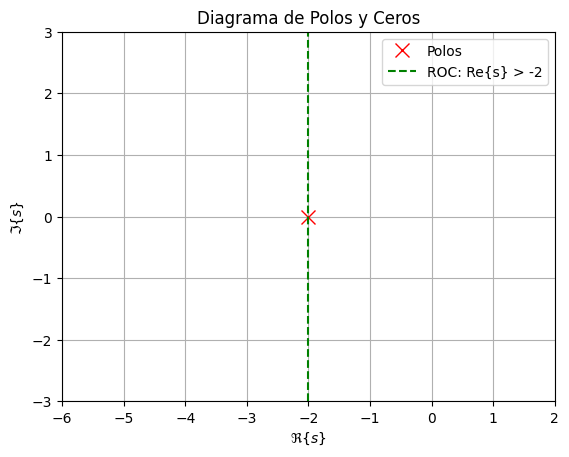

In [14]:
# %matplotlib inline
import sympy as sym
import matplotlib.pyplot as plt

# Inicialización
sym.init_printing()
t, s = sym.symbols('t s', real=True)

# Expresión directa de la Transformada de Laplace
X = (1 - sym.exp(-5*(s + 2))) / (s + 2)

# Simplificación
X_rational = sym.simplify(X)
numer, denom = sym.fraction(sym.together(X_rational))

# Cálculo de polos y ceros si es posible
try:
    poles = list(sym.roots(denom, s).keys())
except:
    poles = []

try:
    zeros = list(sym.roots(numer, s).keys())
except:
    zeros = []

# Mostrar función y ROC
display(sym.Eq(sym.Function('X')(s), X_rational))
display(sym.Eq(sym.Symbol('ROC'), sym.Symbol('Re{s} > -2')))

# Graficar polos y ceros
def pole_zero_plot(poles, zeros):
    fig, ax = plt.subplots()

    for i, p in enumerate(poles):
        ax.plot(sym.re(p), sym.im(p), 'rx', markersize=10, label='Polos' if i == 0 else "")
    for i, z in enumerate(zeros):
        ax.plot(sym.re(z), sym.im(z), 'bo', markersize=10, label='Ceros' if i == 0 else "")

    ax.axvline(x=-2, color='green', linestyle='--', label='ROC: Re{s} > -2')
    ax.set_xlim(-6, 2)
    ax.set_ylim(-3, 3)
    ax.grid(True)
    ax.set_xlabel(r'$\Re \{ s \}$')
    ax.set_ylabel(r'$\Im \{ s \}$')
    ax.set_aspect(1)
    ax.set_title("Diagrama de Polos y Ceros")
    if poles or zeros:
        ax.legend()
    plt.show()

# Ejecutar
pole_zero_plot(poles, zeros)

##  **Ejercicio 6: Funciones de Transferencia en Circuitos RLC**

### 1️ RLC Serie

Obtener la **función de transferencia en lazo abierto** de un **circuito RLC en configuración serie**, donde:

- La **entrada** es la tensión de alimentación $( V_{\text{in}}(t) )$
- La **salida** es la tensión en el capacitor $( V_C(t) )$

Se debe calcular la función de transferencia:

$$
H(s) = \frac{V_C(s)}{V_{\text{in}}(s)}
$$

---

### 2️ RLC Paralelo

Obtener la **función de transferencia en lazo abierto** de un **circuito RLC en configuración paralela**, donde:

- La **entrada** es la corriente total de alimentación $( I_{\text{in}}(t) )$
- La **salida** es la corriente a través del inductor $( I_L(t) )$

Se debe calcular la función de transferencia:

$$
H(s) = \frac{I_L(s)}{I_{\text{in}}(s)}
$$


##  Función de Transferencia en Lazo Abierto - Circuito RLC Serie

---

###  Paso 1: Impedancia total

En un circuito RLC serie, la impedancia total es:

$$
Z_{\text{total}}(s) = R + sL + \frac{1}{sC}
$$

---

###  Paso 2: Aplicar divisor de tensión

Como todos los elementos están en serie, usamos el **divisor de tensión** para hallar $( V_C(s) )$:

$$
V_C(s) = V_{\text{in}}(s) \cdot \frac{\frac{1}{sC}}{R + sL + \frac{1}{sC}}
$$

---

###  Paso 3: Función de transferencia

Dividiendo ambos lados entre $( V_{\text{in}}(s) )$:

$$
H(s) = \frac{V_C(s)}{V_{\text{in}}(s)} = \frac{\frac{1}{sC}}{R + sL + \frac{1}{sC}}
$$

Multiplicamos numerador y denominador por \( sC \) para simplificar:

$$
H(s) = \frac{1}{s^2 LC + sRC + 1}
$$

---

###  Resultado final

La función de transferencia del circuito RLC serie (salida en el capacitor) es:

$$
\boxed{H(s) = \frac{1}{LC s^2 + RC s + 1}}
$$



##  Función de Transferencia - Circuito RLC en Paralelo

---

###  Paso 1: Impedancias de los elementos

Impedancia total:

$$
Y_{\text{total}}(s) = \frac{1}{R} + \frac{1}{sL} + sC
$$

---

###  Paso 2: Aplicar divisor de corriente

La corriente en el inductor se obtiene usando el divisor de corriente:

$$
I_L(s) = I_{\text{in}}(s) \cdot \frac{Y_L(s)}{Y_{\text{total}}(s)} = I_{\text{in}}(s) \cdot \frac{\frac{1}{sL}}{\frac{1}{R} + \frac{1}{sL} + sC}
$$

---

###  Paso 3: Función de transferencia

Dividiendo ambos lados entre $( I_{\text{in}}(s) )$:

$$
H(s) = \frac{I_L(s)}{I_{\text{in}}(s)} = \frac{\frac{1}{sL}}{\frac{1}{R} + \frac{1}{sL} + sC}
$$

Multiplicamos numerador y denominador por \( sL \) para simplificar:

$$
H(s) = \frac{1}{1 + sLR + s^2 LC}
$$

---

###  Resultado final

La función de transferencia del circuito RLC paralelo (salida en la corriente del inductor) es:

$$
\boxed{H(s) = \frac{1}{1 + sLR + s^2 LC}}
$$



## **Ejercicio 7 Análisis en Lazo Cerrado - Respuesta Temporal de Circuitos RLC**

A partir de las funciones de transferencia en **lazo abierto** obtenidas previamente para los circuitos **RLC serie** y **RLC paralelo**, realice lo siguiente:

###  Objetivo:

Encontrar la **expresión de la salida en el tiempo** $( y(t) )$, para una configuración en **lazo cerrado del sistema**, en función de los parámetros \( R \), \( L \) y \( C \), considerando las siguientes señales de entrada:

1.  Impulso unitario: $( \delta(t) )$  
2.  Escalón unitario: $( u(t) )$  
3.  Rampa: $( t \cdot u(t) )$

---

###  Instrucciones:

- Aplicar la transformada de Laplace a cada entrada.
- Multiplicar por la función de transferencia en lazo cerrado.
- Utilizar **fracciones parciales** para simplificar la salida $( Y(s) )$.
- Calcular la **transformada inversa de Laplace** simbólicamente en función de \( R, L, C \).
- Verificar los resultados mediante **simulación en Python (SymPy)** y graficar la respuesta $( y(t) )$ para cada caso.


##  Análisis teórico en lazo cerrado: Circuito RLC serie

Para el circuito RLC serie con salida el voltaje en el capacitor, se analiza la respuesta del sistema en lazo cerrado para diferentes entradas.

---

### Paso 1: Función de transferencia en lazo abierto

La función de transferencia en lazo abierto es:

$$
H_{\text{abierto}}(s) = \frac{1}{LCs^2 + RCs + 1}
$$

---

###  Paso 2: Función de transferencia en lazo cerrado

Para realimentación unitaria, la función de transferencia en lazo cerrado es:

$$
H_{\text{cerrado}}(s) = \frac{H_{\text{abierto}}(s)}{1 + H_{\text{abierto}}(s)} = \frac{1}{LCs^2 + RCs + 2}
$$

---

###  Paso 3: Respuesta del sistema para distintas entradas

#### A) Entrada impulso $( \delta(t) )$

Transformada de entrada:

$$
\mathcal{L}\{\delta(t)\} = 1
$$

Entonces:

$$
Y(s) = \frac{1}{LCs^2 + RCs + 2}
$$

---

#### B) Entrada escalón unitario $( u(t) )$

Transformada de entrada:

$$
\mathcal{L}\{u(t)\} = \frac{1}{s}
$$

Entonces:

$$
Y(s) = \frac{1}{s} \cdot \frac{1}{LCs^2 + RCs + 2}
= \frac{1}{s(LCs^2 + RCs + 2)}
$$

---

#### C) Entrada rampa $( t \cdot u(t) )$

Transformada de entrada:

$$
\mathcal{L}\{t \cdot u(t)\} = \frac{1}{s^2}
$$

Entonces:

$$
Y(s) = \frac{1}{s^2} \cdot \frac{1}{LCs^2 + RCs + 2}
= \frac{1}{s^2(LCs^2 + RCs + 2)}
$$

---

A continuación, se procederá a obtener las transformadas inversas de cada expresión utilizando Python (SymPy) y se graficará la señal de salida.




=== Entrada: Impulso ===



               1         
Y(s) = ──────────────────
            2            
       C⋅L⋅s  + C⋅R⋅s + 2

Salida y(t) para entrada: Impulso


0

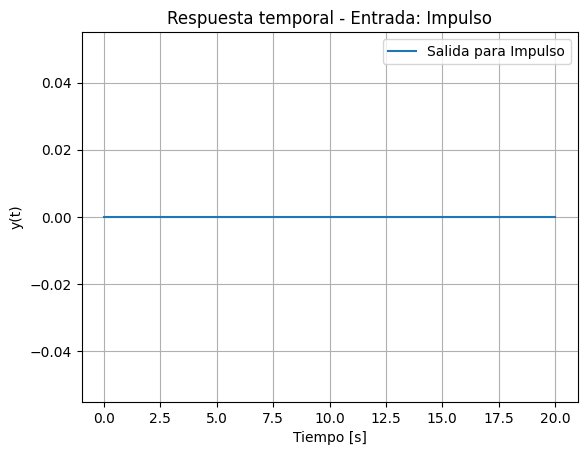



=== Entrada: Escalón ===



              C⋅(L⋅s + R)          1 
Y(s) = - ────────────────────── + ───
           ⎛     2            ⎞   2⋅s
         2⋅⎝C⋅L⋅s  + C⋅R⋅s + 2⎠      

Salida y(t) para entrada: Escalón


     -t             -t         
1   ℯ  ⋅sin(3⋅t)   ℯ  ⋅cos(3⋅t)
─ - ──────────── - ────────────
2        6              2      

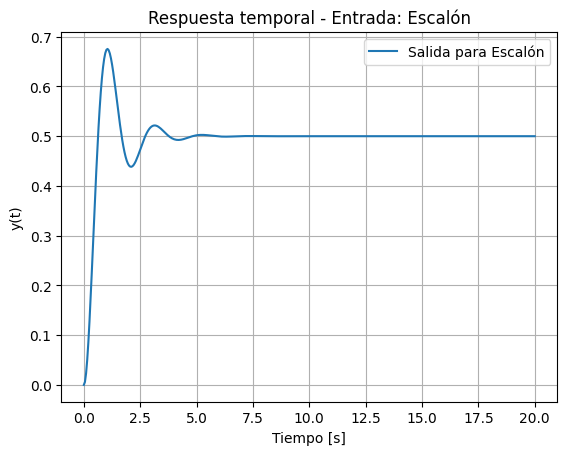



=== Entrada: Rampa ===



                 ⎛             2      ⎞       
         C⋅R   C⋅⎝C⋅L⋅R⋅s + C⋅R  - 2⋅L⎠    1  
Y(s) = - ─── + ──────────────────────── + ────
         4⋅s      ⎛     2            ⎞       2
                4⋅⎝C⋅L⋅s  + C⋅R⋅s + 2⎠    2⋅s 

Salida y(t) para entrada: Rampa


            -t             -t         
t   1    2⋅ℯ  ⋅sin(3⋅t)   ℯ  ⋅cos(3⋅t)
─ - ── - ────────────── + ────────────
2   10         15              10     

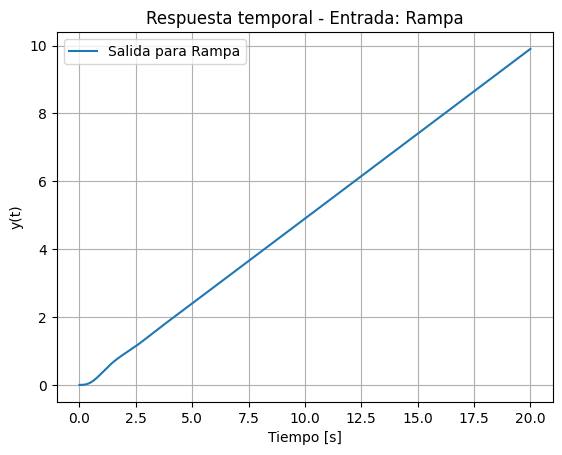

In [18]:
# %matplotlib inline
import sympy as sym
import matplotlib.pyplot as plt
import sympy.physics.control as control
import numpy as np

# Inicialización
sym.init_printing()

# Declarar símbolos
s = sym.symbols('s', complex=True)
t, R, L, C = sym.symbols('t R L C', positive=True)

# Valores numéricos para simulación
RLC = {R: 1, L: sym.Rational('0.5'), C: sym.Rational('0.4')}

# Función de transferencia en lazo cerrado
Hc = control.TransferFunction(1, L*C*s**2 + R*C*s + 2, s)

# Entradas a simular
entradas = {
    "Impulso": 1,
    "Escalón": 1/s,
    "Rampa": 1/s**2
}

# Recorrer cada entrada
for tipo, X in entradas.items():
    print(f"\n\n=== Entrada: {tipo} ===\n")

    # Salida Y(s) = H(s) * X(s)
    Y = Hc.num * X / Hc.den

    # Fracciones parciales
    Yp = Y.apart(s)
    display(sym.Eq(sym.Function('Y')(s), Yp))

    # Inversa simbólica con parámetros RLC
    Ye = Yp.subs(RLC)

    if hasattr(Ye, 'args') and len(Ye.args) > 1:
        for j in range(len(Ye.args)):
            if j == 0:
                yt = sym.inverse_laplace_transform(Ye.args[j], s, t)
            else:
                yt += sym.inverse_laplace_transform(Ye.args[j], s, t)
    else:
        yt = sym.inverse_laplace_transform(Ye, s, t)

    print(f"Salida y(t) para entrada: {tipo}")
    display(yt)

    # Evaluar función en el tiempo
    yt_num = yt.subs(RLC)
    f_lambdified = sym.lambdify(t, yt_num, modules=['numpy'])

    tt = np.linspace(0, 20, 400)

    # Convertir a array si es constante
    if np.isscalar(f_lambdified(tt)):
        yy = np.full_like(tt, f_lambdified(tt))
    else:
        yy = f_lambdified(tt)

    plt.figure()
    plt.plot(tt, yy, label=f'Salida para {tipo}')
    plt.title(f'Respuesta temporal - Entrada: {tipo}')
    plt.xlabel('Tiempo [s]')
    plt.ylabel('y(t)')
    plt.grid(True)
    plt.legend()
    plt.show()


##  Parte 2: Análisis del circuito RLC en paralelo (configuración en lazo cerrado)

---

###  Función de transferencia en lazo abierto

Para un circuito RLC en paralelo, donde la entrada es la **corriente de alimentación** $( I_{\text{in}}(s) )$ y la salida es la **corriente en el inductor** $( I_L(s) )$, la función de transferencia en lazo abierto es:

$$
H_{\text{abierto}}(s) = \frac{R}{RLCs^2 + LC s + R}
$$

---

###  Lazo cerrado

En lazo cerrado con retroalimentación unitaria:

$$
H_{\text{cerrado}}(s) = \frac{H_{\text{abierto}}(s)}{1 + H_{\text{abierto}}(s)} = \frac{R}{RLCs^2 + LC s + 2R}
$$

---





=== Entrada: Impulso ===



                 R           
Y(s) = ──────────────────────
              2              
       C⋅L⋅R⋅s  + C⋅L⋅s + 2⋅R

Salida y(t) para entrada: Impulso


0

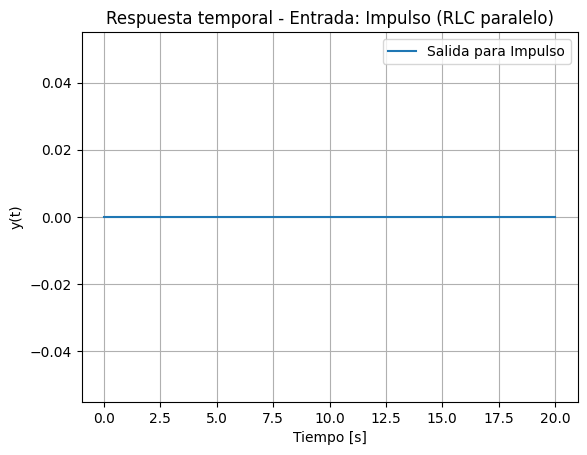



=== Entrada: Escalón ===



               C⋅L⋅(R⋅s + 1)           1 
Y(s) = - ────────────────────────── + ───
           ⎛       2              ⎞   2⋅s
         2⋅⎝C⋅L⋅R⋅s  + C⋅L⋅s + 2⋅R⎠      

Salida y(t) para entrada: Escalón


         -t                -t            
         ───               ───           
          2     ⎛√39⋅t⎞     2     ⎛√39⋅t⎞
    √39⋅ℯ   ⋅sin⎜─────⎟   ℯ   ⋅cos⎜─────⎟
1               ⎝  2  ⎠           ⎝  2  ⎠
─ - ─────────────────── - ───────────────
2           78                   2       

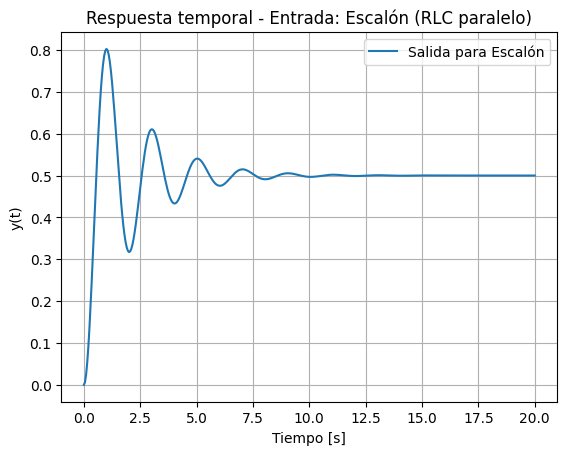



=== Entrada: Rampa ===



            ⎛                   2⎞                
        C⋅L⋅⎝C⋅L⋅R⋅s + C⋅L - 2⋅R ⎠     C⋅L     1  
Y(s) = ──────────────────────────── - ───── + ────
           ⎛       2              ⎞   4⋅R⋅s      2
       4⋅R⋅⎝C⋅L⋅R⋅s  + C⋅L⋅s + 2⋅R⎠           2⋅s 

Salida y(t) para entrada: Rampa


                 -t                -t            
                 ───               ───           
                  2     ⎛√39⋅t⎞     2     ⎛√39⋅t⎞
         19⋅√39⋅ℯ   ⋅sin⎜─────⎟   ℯ   ⋅cos⎜─────⎟
t   1                   ⎝  2  ⎠           ⎝  2  ⎠
─ - ── - ────────────────────── + ───────────────
2   20            780                   20       

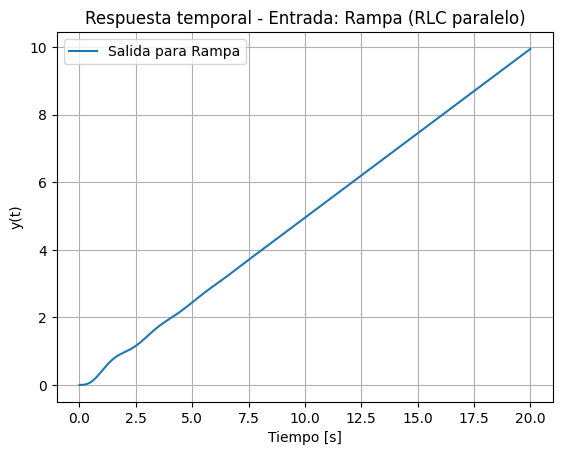

In [19]:
# %matplotlib inline
import sympy as sym
import matplotlib.pyplot as plt
import sympy.physics.control as control
import numpy as np

# Inicialización
sym.init_printing()

# Símbolos
s = sym.symbols('s', complex=True)
t, R, L, C = sym.symbols('t R L C', positive=True)

# Valores para simulación
RLC = {R: 1, L: sym.Rational('0.5'), C: sym.Rational('0.4')}

# Función de transferencia del RLC paralelo en lazo cerrado
# Hc(s) = R / (RLCs^2 + LCs + 2R)
numerador = R
denominador = R*L*C*s**2 + L*C*s + 2*R
Hc = control.TransferFunction(numerador, denominador, s)

# Entradas a simular
entradas = {
    "Impulso": 1,
    "Escalón": 1/s,
    "Rampa": 1/s**2
}

# Recorrer cada entrada
for tipo, X in entradas.items():
    print(f"\n\n=== Entrada: {tipo} ===\n")

    # Salida en Laplace
    Y = Hc.num * X / Hc.den
    Yp = Y.apart(s)

    display(sym.Eq(sym.Function('Y')(s), Yp))

    # Transformada inversa con parámetros numéricos
    Ye = Yp.subs(RLC)

    if hasattr(Ye, 'args') and len(Ye.args) > 1:
        for j in range(len(Ye.args)):
            if j == 0:
                yt = sym.inverse_laplace_transform(Ye.args[j], s, t)
            else:
                yt += sym.inverse_laplace_transform(Ye.args[j], s, t)
    else:
        yt = sym.inverse_laplace_transform(Ye, s, t)

    print(f"Salida y(t) para entrada: {tipo}")
    display(yt)

    # Convertir a función numérica y graficar
    yt_num = yt.subs(RLC)
    f_lambdified = sym.lambdify(t, yt_num, modules=['numpy'])

    tt = np.linspace(0, 20, 400)

    if np.isscalar(f_lambdified(tt)):
        yy = np.full_like(tt, f_lambdified(tt))
    else:
        yy = f_lambdified(tt)

    plt.figure()
    plt.plot(tt, yy, label=f'Salida para {tipo}')
    plt.title(f'Respuesta temporal - Entrada: {tipo} (RLC paralelo)')
    plt.xlabel('Tiempo [s]')
    plt.ylabel('y(t)')
    plt.grid(True)
    plt.legend()
    plt.show()


## **Ejercicio 8 Análisis de amortiguamiento en sistemas RLC**

Consulte y analice los diferentes tipos de comportamiento dinámico en sistemas de segundo orden representados por circuitos RLC en serie y paralelo, según el valor del **factor de amortiguamiento** $( \zeta )$:

- **Sistema subamortiguado**: $( 0 < \zeta < 1 )$
- **Sistema sobreamortiguado**: $( \zeta > 1 )$
- **Amortiguamiento crítico**: $( \zeta = 1 )$

Se deben asumir **condiciones iniciales cero** y utilizar los modelos previamente estudiados para los circuitos **RLC serie** y **RLC paralelo**.

---

### Expresiones importantes

Para ambos casos, la ecuación característica de un sistema de segundo orden es:

$$
s^2 + 2\zeta\omega_n s + \omega_n^2 = 0
$$

Donde:

- $( \omega_n )$: Frecuencia natural no amortiguada
- $( \zeta )$: Factor de amortiguamiento
- $( \omega_d = \omega_n\sqrt{1 - \zeta^2} )$: Frecuencia natural amortiguada (si $( \zeta < 1 ))$

---

### Circuito RLC en serie

La función de transferencia en lazo cerrado está dada por:

$$
H(s) = \frac{1}{LCs^2 + RCs + 1}
$$

Por comparación con el modelo estándar:

- $( \omega_n = \frac{1}{\sqrt{LC}} )$
- $( \zeta = \frac{R}{2} \sqrt{\frac{C}{L}} )$
- $( \omega_d = \omega_n \sqrt{1 - \zeta^2} )$

---

### Circuito RLC en paralelo

La función de transferencia en lazo cerrado está dada por:

$$
H(s) = \frac{1}{\frac{1}{LC}s^2 + \frac{1}{RC}s + 1}
$$

Por comparación:

- $( \omega_n = \frac{1}{\sqrt{LC}} )$
- $( \zeta = \frac{1}{2R} \sqrt{\frac{L}{C}} )$
- $( \omega_d = \omega_n \sqrt{1 - \zeta^2} )$

---

### Actividades a realizar

1. Determine y grafique la respuesta del sistema para cada uno de los siguientes casos:
   - Subamortiguado $( \zeta < 1 )$
   - Sobreamortiguado $( \zeta > 1 )$
   - Amortiguamiento crítico $( \zeta = 1 )$

2. Realice las simulaciones en Python (utilizando `SymPy` y `matplotlib`) para ambos circuitos (serie y paralelo).





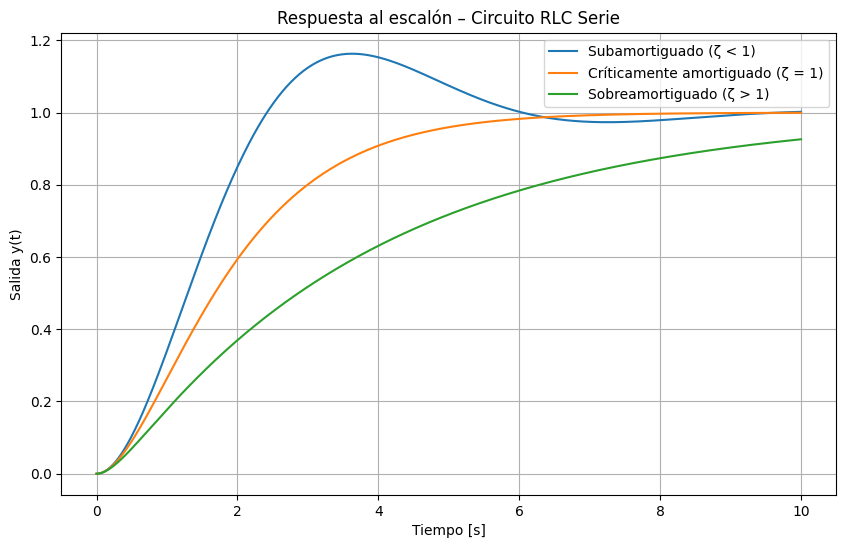

In [21]:
import sympy as sym
import matplotlib.pyplot as plt
import numpy as np
import sympy.physics.control as control

# Inicialización
sym.init_printing()

# Variables simbólicas
s, t = sym.symbols('s t', real=True, positive=True)
R, L, C = sym.symbols('R L C', real=True, positive=True)

# Función de transferencia en lazo cerrado para circuito RLC serie
# H(s) = 1 / (LC s^2 + RC s + 1)
H_s = control.TransferFunction(1, L*C*s**2 + R*C*s + 1, s)

# Parámetros de simulación
casos = {
    'Subamortiguado (ζ < 1)': {R: 1, L: 1, C: 1},
    'Críticamente amortiguado (ζ = 1)': {R: 2, L: 1, C: 1},
    'Sobreamortiguado (ζ > 1)': {R: 4, L: 1, C: 1}
}

tt = np.linspace(0, 10, 500)

plt.figure(figsize=(10, 6))
for nombre, valores in casos.items():
    # Sustituimos R, L, C
    num = H_s.num.subs(valores)
    den = H_s.den.subs(valores)

    # Salida Y(s) = H(s) * 1/s (escalón unitario)
    Y = num / (den * s)
    Yp = Y.apart(s)

    # Transformada inversa
    yt = sum(sym.inverse_laplace_transform(term, s, t) for term in Yp.args)
    yt_func = sym.lambdify(t, yt, modules='numpy')
    yy = yt_func(tt)

    plt.plot(tt, yy, label=nombre)

plt.title("Respuesta al escalón – Circuito RLC Serie")
plt.xlabel("Tiempo [s]")
plt.ylabel("Salida y(t)")
plt.grid(True)
plt.legend()
plt.show()



Caso: Subamortiguado


      -t           
      ───          
       2     ⎛√3⋅t⎞
2⋅√3⋅ℯ   ⋅sin⎜────⎟
             ⎝ 2  ⎠
───────────────────
         3         


Caso: Críticamente amortiguado


   -t
t⋅ℯ  


Caso: Sobreamortiguado


    -2⋅t           
√3⋅ℯ    ⋅sinh(√3⋅t)
───────────────────
         3         

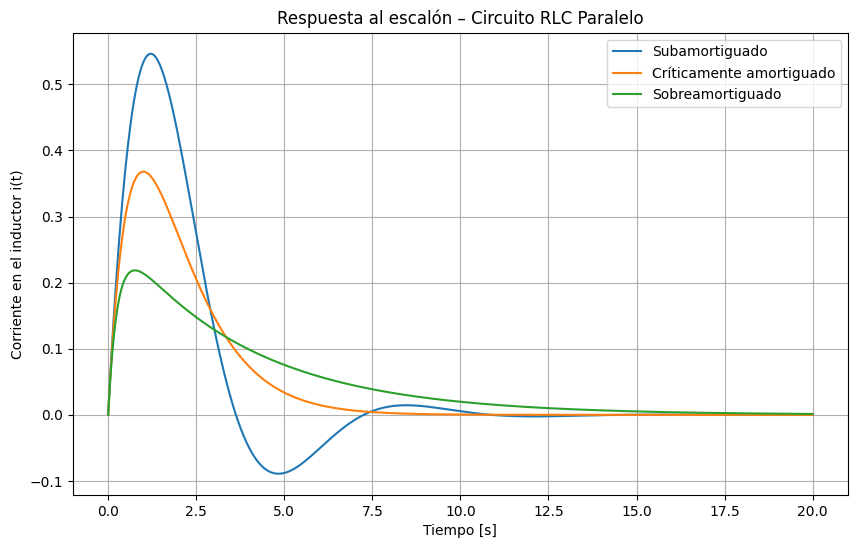

In [25]:
import sympy as sym
import matplotlib.pyplot as plt
import numpy as np

sym.init_printing()

# Variables simbólicas
s = sym.symbols('s', complex=True)
t, R, L, C = sym.symbols('t R L C', positive=True)

# Tiempo para graficar
tt = np.linspace(0, 20, 500)

# Casos de amortiguamiento
casos = {
    "Subamortiguado": {R: 1, L: 1, C: 1},
    "Críticamente amortiguado": {R: 2, L: 1, C: 1},
    "Sobreamortiguado": {R: 4, L: 1, C: 1}
}

# Función de transferencia simbólica del RLC paralelo:
# H(s) = s / (LCs² + RCs + 1)
H_s = s / (L*C*s**2 + R*C*s + 1)

plt.figure(figsize=(10, 6))

for nombre, valores in casos.items():
    # Salida Y(s) = H(s) * 1/s (respuesta al escalón)
    H_val = H_s.subs(valores)
    Y = sym.simplify(H_val * (1/s))
    Yp = sym.apart(Y, s)

    # Transformada inversa
    yt = sym.inverse_laplace_transform(Yp, s, t)
    print(f"\nCaso: {nombre}")
    display(yt)

    # Convertir a función numérica
    yt_func = sym.lambdify(t, yt, modules='numpy')
    yy = yt_func(tt)

    # Si es constante, convertir a array
    if np.isscalar(yy):
        yy = np.full_like(tt, yy)

    plt.plot(tt, yy, label=nombre)

# Gráfica
plt.title("Respuesta al escalón – Circuito RLC Paralelo")
plt.xlabel("Tiempo [s]")
plt.ylabel("Corriente en el inductor i(t)")
plt.grid(True)
plt.legend()
plt.show()


## **DASHBOARD**

In [26]:

#instalación de librerías
!pip install streamlit -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 66.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 101.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 5.4 MB/s eta 0:00:00


In [31]:
!mkdir pages

In [27]:
%%writefile 0_👋_Hello.py

import streamlit as st

st.set_page_config(
    page_title="Bienvenida",
    page_icon="👋",
)

st.write("# Bienvenido a Streamlit! 👋")

st.sidebar.success("Seleccciona una demo a explorar.")

st.markdown(
    """
    Streamlit es una aplicación de código abierto creado específicamente para
    Proyectos de Machine Learning y Data Science.
    **👈 Seleccione una demostración de la barra lateral** para ver algunos ejemplos
    ¡De lo que Streamlit puede hacer!
    ### ¿Quieres saber más?
    - Consulta [streamlit.io] (https://streamlit.io)
    - Revisa la [documentación](https://docs.streamlit.io)
"""
)

Writing 0_👋_Hello.py


In [47]:
%%writefile 1_📈_Simulacion_RLC.py
import streamlit as st
import matplotlib.pyplot as plt
import sympy as sym
import sympy.physics.control as control
import numpy as np
from scipy import signal

# Configuración de la página
st.set_page_config(page_title="Simulación Circuitos RLC", page_icon="📈")
st.markdown("# Simulador de Circuitos RLC (Serie / Paralelo)")
st.sidebar.header("Configuración del Sistema")

# --- Parámetros del usuario ---
circuito_tipo = st.sidebar.selectbox("Tipo de circuito:", ["RLC Serie", "RLC Paralelo"])
tipo_respuesta = st.sidebar.selectbox("Tipo de respuesta:", ["subamortiguada", "sobreamortiguada", "critica", "inestable"])
omega_n = st.sidebar.slider("Frecuencia natural ωₙ [rad/s]", min_value=0.1, max_value=2.0, value=0.3, step=0.05)

if tipo_respuesta == "subamortiguada":
    zeta = st.sidebar.slider("ζ (0 < ζ < 1)", min_value=0.01, max_value=0.99, value=0.5)
elif tipo_respuesta == "sobreamortiguada":
    zeta = st.sidebar.slider("ζ (> 1)", min_value=1.01, max_value=5.0, value=1.5)
elif tipo_respuesta == "critica":
    zeta = 1.0
else:
    zeta = st.sidebar.slider("ζ (< 0)", min_value=-2.0, max_value=-0.01, value=-0.2)

# --- Símbolos ---
s, t = sym.symbols('s t', complex=True)
R, L, C = sym.symbols('R L C', positive=True)
C_valor = 0.01
L_valor = 1 / (C_valor * omega_n**2)
R_valor = (1 / (2 * zeta)) * np.sqrt(L_valor / C_valor)
subs = {R: R_valor, L: L_valor, C: C_valor}

# --- Función de transferencia simbólica ---
if circuito_tipo == "RLC Serie":
    H_sym = 1 / (L*C*s**2 + R*C*s + 1)
else:
    H_sym = s / (L*C*s**2 + R*C*s + 1)

H_sym = sym.simplify(H_sym)
H_num, H_den = sym.fraction(H_sym)

# Transfer Function simbólica con valores numéricos
H_abierto = control.TransferFunction(H_num.subs(subs), H_den.subs(subs), s)
H_cerrado = control.TransferFunction(H_abierto.num, H_abierto.den + H_abierto.num, s)

# --- Respuesta al escalón (símbolos) ---
Y_s = (H_cerrado.num / (H_cerrado.den * s)).expand()
y_t = sym.inverse_laplace_transform(Y_s, s, t)
y_func = sym.lambdify(t, y_t, modules='numpy')
tt = np.linspace(0, 80, 1000)
yy = y_func(tt)
y_final = yy[-1] if len(yy) > 0 else 0

# --- Parámetros temporales ---
tp = Mp = ts = tu = None
if zeta > 0:
    ts = 3 / (zeta * omega_n)
    indices_10 = np.where(yy >= 0.1 * y_final)[0]
    indices_90 = np.where(yy >= 0.9 * y_final)[0]
    if indices_10.size and indices_90.size:
        tu = tt[indices_90[0]] - tt[indices_10[0]]
    if 0 < zeta < 1:
        tp = np.pi / (omega_n * np.sqrt(1 - zeta**2))
        x_max = np.max(yy)
        Mp = 100 * (x_max - y_final) / y_final if y_final != 0 else 0

# --- Función auxiliar para convertir TransferFunction simbólica a scipy ---
def tf_to_scipy(tf_sym):
    num = sym.Poly(tf_sym.num, s).all_coeffs()
    den = sym.Poly(tf_sym.den, s).all_coeffs()
    num = [float(c.evalf()) for c in num]
    den = [float(c.evalf()) for c in den]
    return signal.TransferFunction(num, den)

# --- Gráfico: Respuesta al Escalón ---
st.subheader("Respuesta al Escalón (Lazo Cerrado)")
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(tt, yy, label="Respuesta Escalón", color='blue')
ax.set_title(f"{circuito_tipo} - {tipo_respuesta}, ζ={zeta}")
ax.set_xlabel("Tiempo [s]")
ax.set_ylabel("y(t)")
ax.grid(True)
ax.axhline(1, color='gray', linestyle='--', linewidth=0.8)
if tp: ax.axvline(tp, color='red', linestyle='--', label=f"tₚ = {tp:.2f} s")
if ts: ax.axvline(ts, color='green', linestyle='--', label=f"tₛ = {ts:.2f} s")
if tu:
    ax.axvline(tt[indices_10[0]], color='orange', linestyle=':', label="t10%")
    ax.axvline(tt[indices_90[0]], color='purple', linestyle=':', label="t90%")
ax.legend()
st.pyplot(fig)

# --- Mostrar valores calculados ---
st.subheader("Parámetros Calculados")
st.markdown(f"- **Circuito**: `{circuito_tipo}`")
st.markdown(f"- **Tipo de respuesta**: `{tipo_respuesta}`")
st.markdown(f"- **ζ (factor de amortiguamiento)**: `{zeta}`")
st.markdown(f"- **ωₙ (frecuencia natural)**: `{omega_n} rad/s`")
st.markdown(f"- **C (fijo)**: `{C_valor:.4f} F`")
st.markdown(f"- **L**: `{L_valor:.4f} H`, **R**: `{R_valor:.4f} Ω`")

if zeta > 0:
    st.subheader("Parámetros Temporales")
    if tp: st.markdown(f"- `tₚ`: `{tp:.2f} s`")
    if Mp: st.markdown(f"- `Mₚ`: `{Mp:.2f} %`")
    st.markdown(f"- `tₛ`: `{ts:.2f} s`")
    if tu: st.markdown(f"- `tₜ`: `{tu:.2f} s`")

# --- Gráficas adicionales ---
sys = tf_to_scipy(H_cerrado)

# Diagrama de Bode
st.subheader("📊 Diagrama de Bode (Lazo Cerrado)")
w, mag, phase = signal.bode(sys)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6))
ax1.semilogx(w, mag)
ax1.set_ylabel("Magnitud [dB]")
ax1.set_title("Magnitud")
ax1.grid(True, which="both", linestyle='--')
ax2.semilogx(w, phase)
ax2.set_ylabel("Fase [°]")
ax2.set_xlabel("Frecuencia [rad/s]")
ax2.set_title("Fase")
ax2.grid(True, which="both", linestyle='--')
plt.tight_layout()
st.pyplot(fig)

# Diagrama de Polos y Ceros
st.subheader("⚙️ Diagrama de Polos y Ceros (Lazo Cerrado)")
fig, ax = plt.subplots()
poles = sys.poles
zeros = sys.zeros
ax.scatter(np.real(zeros), np.imag(zeros), marker='o', facecolors='none', edgecolors='b', label='Ceros')
ax.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
ax.axhline(0, color='black', linewidth=0.5)
ax.axvline(0, color='black', linewidth=0.5)
ax.set_xlabel("Re")
ax.set_ylabel("Im")
ax.set_title("Plano S")
ax.grid(True)
ax.legend()
st.pyplot(fig)

# Respuesta al impulso
st.subheader("⏱️ Respuesta al Impulso (Lazo Cerrado)")
t_imp, y_imp = signal.impulse(sys)
fig, ax = plt.subplots()
ax.plot(t_imp, y_imp, label="Impulso", color='purple')
ax.set_xlabel("Tiempo [s]")
ax.set_ylabel("Amplitud")
ax.set_title("Respuesta al Impulso")
ax.grid(True)
st.pyplot(fig)

# Respuesta a la rampa
st.subheader("↗️ Respuesta a la Rampa (Lazo Cerrado)")
t_ramp = np.linspace(0, 50, 1000)
u_ramp = t_ramp
t_out, y_ramp, _ = signal.lsim(sys, U=u_ramp, T=t_ramp)
fig, ax = plt.subplots()
ax.plot(t_ramp, y_ramp, label="Salida", color='orange')
ax.plot(t_ramp, u_ramp, '--', label="Entrada Rampa", color='gray')
ax.set_xlabel("Tiempo [s]")
ax.set_ylabel("Amplitud")
ax.set_title("Respuesta a la Rampa")
ax.grid(True)
ax.legend()
st.pyplot(fig)


Writing 1_📈_Simulacion_RLC.py


In [48]:
!mv 1_📈_Simulacion_RLC.py pages/

In [50]:
!wget https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64
!chmod +x cloudflared-linux-amd64
!mv cloudflared-linux-amd64 /usr/local/bin/cloudflared

#Ejecutar Streamlit
!streamlit run 0_👋_Hello.py &>/content/logs.txt & #Cambiar 0_👋_Hello.py por el nombre de tu archivo principal

#Exponer el puerto 8501 con Cloudflare Tunnel
!cloudflared tunnel --url http://localhost:8501 > /content/cloudflared.log 2>&1 &

#Leer la URL pública generada por Cloudflare
import time
time.sleep(5)  # Esperar que se genere la URL

import re
found_context = False  # Indicador para saber si estamos en la sección correcta

with open('/content/cloudflared.log') as f:
    for line in f:
        #Detecta el inicio del contexto que nos interesa
        if "Your quick Tunnel has been created" in line:
            found_context = True

        #Busca una URL si ya se encontró el contexto relevante
        if found_context:
            match = re.search(r'https?://\S+', line)
            if match:
                url = match.group(0)  #Extrae la URL encontrada
                print(f'Tu aplicación está disponible en: {url}')
                break  #Termina el bucle después de encontrar la URL

--2025-07-15 04:06:56--  https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/cloudflare/cloudflared/releases/download/2025.7.0/cloudflared-linux-amd64 [following]
--2025-07-15 04:06:57--  https://github.com/cloudflare/cloudflared/releases/download/2025.7.0/cloudflared-linux-amd64
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/106867604/37d2bad8-a2ed-4b93-8139-cbb15162d81d?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-07-15T05%3A05%3A56Z&rscd=attachment%3B+filename%3Dcloudflared-linux-amd64&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-07-15T0

In [51]:

import os

res = input("Digite (1) para finalizar la ejecución del Dashboard: ")

if res.upper() == "1":
    os.system("pkill streamlit")  # Termina el proceso de Streamlit
    print("El proceso de Streamlit ha sido finalizado.")

Digite (1) para finalizar la ejecución del Dashboard: 1
El proceso de Streamlit ha sido finalizado.
